In [1]:
%matplotlib inline

import glob
import matplotlib.pyplot as plt
import numpy as np
import numpy.typing as npt
import pandas as pd
import scipy
import sys

from collections import defaultdict
from datetime import datetime
from typing import Any, Dict, List, Tuple, TypedDict

sys.path.append('../../feeg_fmri_sync')

from feeg_fmri_sync.constants import fMRIData
from feeg_fmri_sync.models import HemodynamicModel
from feeg_fmri_sync.plotting import (
    plot_all_search_results,
    plot_all_search_results_2d,
    plot_all_search_results_one_graph,
    plot_local_minima
)
from feeg_fmri_sync.search import get_suitable_range, search_voxels
from feeg_fmri_sync.utils import (
    generate_descriptions_from_search_df,
    get_est_hemodynamic_response,
    get_ratio_eeg_freq_to_fmri_freq,
)
from feeg_fmri_sync.vectorized_models import VectorizedHemodynamicModel, VectorizedSumEEGHemodynamicModel


from tests.helpers import (
    load_test_eeg_with_nans,
    load_test_eeg_without_nans,
    load_simulated_raw_fmri,
    generate_downsampled_simulated_fmri,
    generate_summed_simulated_fmri,
)

In [2]:
class ModelToFMRI(TypedDict):
    name: str
    fmri_data_options: Dict[str, fMRIData]
    fmri_to_plot: List[str]

In [3]:
try_to_reuse = True

## Initialize constants for Hemodynamic Modeling

In [4]:
### Initialize constants ###
sample_freq = 20
tr = 800
n_tr_skipped_at_beginning = 0
hemodynamic_response_window = 30

# Actual Values to generate data from
expected_delta = 2.25
expected_tau=1.25
expected_alpha=2

time_steps = np.arange(hemodynamic_response_window*sample_freq + 1) / sample_freq
hrf = get_est_hemodynamic_response(time_steps, expected_delta, expected_tau, expected_alpha)
r_fmri = get_ratio_eeg_freq_to_fmri_freq(sample_freq, tr)

In [5]:
# eeg data types to use - with or without missing data
# Data will always be estimated without missing data
eeg_data_options = {
    'without_nans': load_test_eeg_without_nans(sample_frequency=sample_freq),
    'with_nans': load_test_eeg_with_nans(sample_frequency=sample_freq),
}

# Plot the generated data
# NOTE: only the first of the trials will be plotted
plot_generated_data = True

# Plot perfect data when modeling
plot_perfect_comparison = True

# noises to examine and plot when modeling
noise_range = range(1, 11)  
noises_to_plot = [3, 5, 10]

# trials we run for each condition and how many trials to plot when modeling
num_trials = 100  
num_trials_to_plot = 1

# models to examine
models_to_test = {
    VectorizedHemodynamicModel: {
        'name': 'downsample',
        'fmri_data_generator': generate_downsampled_simulated_fmri
    },
    VectorizedSumEEGHemodynamicModel: {
        'name': 'sum',
        'fmri_data_generator': generate_summed_simulated_fmri
    }
}

## Display Generated Noise against Simulated Ground Truth

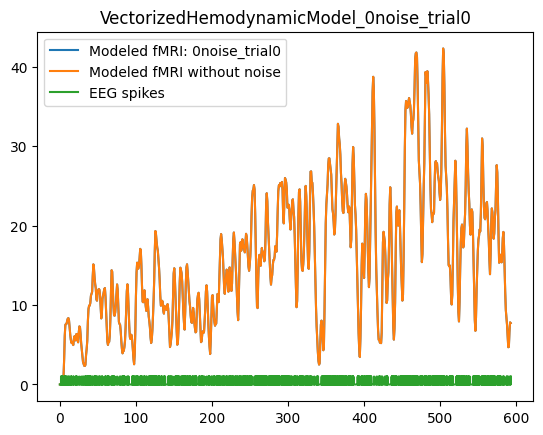

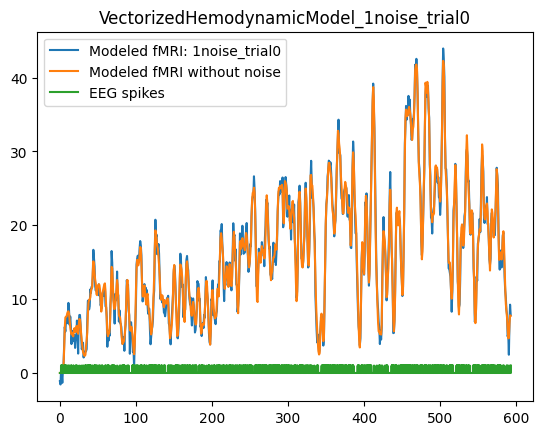

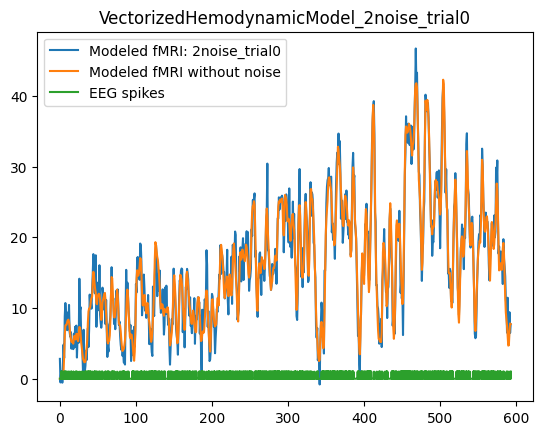

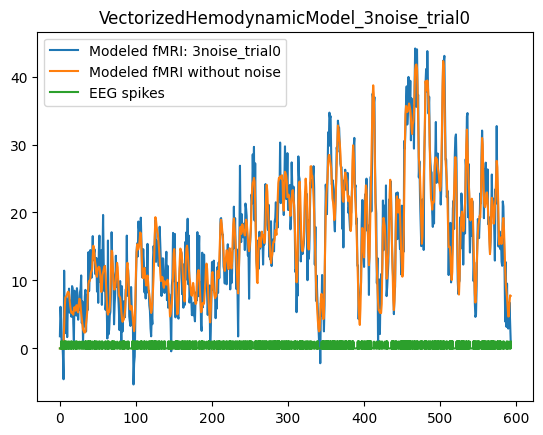

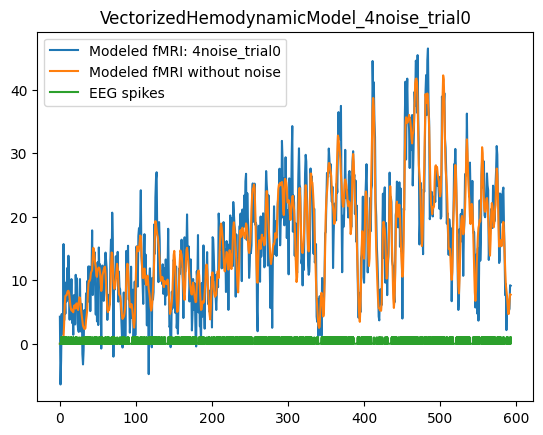

...

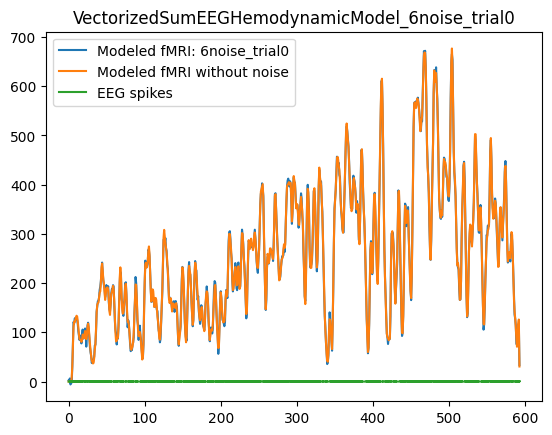

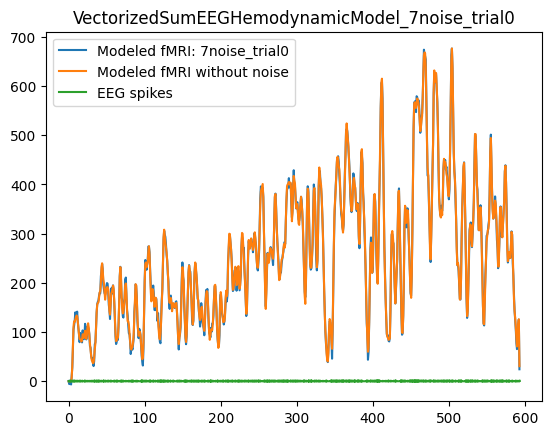

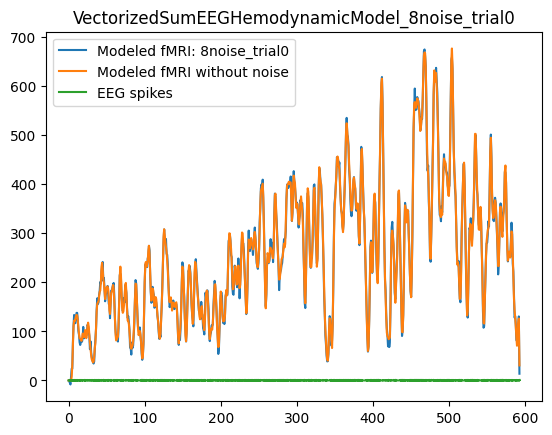

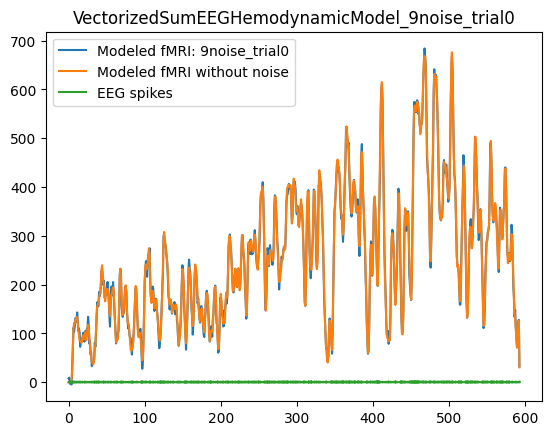

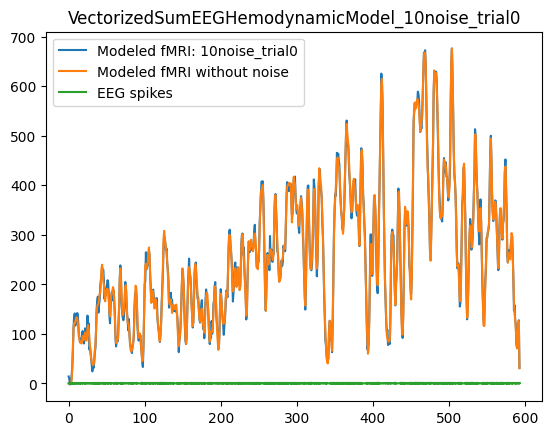

In [6]:
model_to_fmri = dict()

for model, attrs in models_to_test.items():
    fmri_data_options = {}
    fmri_to_plot = []
    name = f'0noise_trial0'
    fmri_data_options[name] = attrs['fmri_data_generator'](
        tr, 
        r_fmri, 
        eeg_data_options['without_nans'],
        hrf,
        0,
        plot=plot_generated_data,
        title=f'{model.__name__}_{name}',
        name = name,
    )
    if plot_perfect_comparison:
        fmri_to_plot.append(name)
    for trial in range(num_trials):
        for noise in noise_range:
            name = f'{noise}noise_trial{trial}'
            fmri_data_options[name] = attrs['fmri_data_generator'](
                tr, 
                r_fmri, 
                eeg_data_options['without_nans'],
                hrf,
                noise,
                plot=plot_generated_data if trial==0 else False,
                title=f'{model.__name__}_{name}',
                name=name
            )
            if noise in noises_to_plot and trial < num_trials_to_plot:
                fmri_to_plot.append(name)
    model_to_fmri[model] = ModelToFMRI(
        name=attrs['name'],
        fmri_data_options=fmri_data_options,
        fmri_to_plot=fmri_to_plot
    )


In [7]:
step_size = 32

filename_substring = f'effect_of_step_size_step_{step_size}'
filename_ext = '.csv'
plot = True

delta = get_suitable_range(1, 3, step_size)
tau = get_suitable_range(0.75, 1.75, step_size)
alpha = get_suitable_range(1.75, 2.25, step_size)

print(f'Delta target: {expected_delta}, Range:\n{delta}\n')
print(f'Tau target: {expected_tau}, Range:\n{tau}\n')
print(f'Alpha target: {expected_alpha}, Range:\n{alpha}\n')

Delta target: 2.25, Range:
[1.         1.06451613 1.12903226 1.19354839 1.25806452 1.32258065
 1.38709677 1.4516129  1.51612903 1.58064516 1.64516129 1.70967742
 1.77419355 1.83870968 1.90322581 1.96774194 2.03225806 2.09677419
 2.16129032 2.22580645 2.29032258 2.35483871 2.41935484 2.48387097
 2.5483871  2.61290323 2.67741935 2.74193548 2.80645161 2.87096774
 2.93548387 3.        ]

Tau target: 1.25, Range:
[0.75       0.78225806 0.81451613 0.84677419 0.87903226 0.91129032
 0.94354839 0.97580645 1.00806452 1.04032258 1.07258065 1.10483871
 1.13709677 1.16935484 1.2016129  1.23387097 1.26612903 1.2983871
 1.33064516 1.36290323 1.39516129 1.42741935 1.45967742 1.49193548
 1.52419355 1.55645161 1.58870968 1.62096774 1.65322581 1.68548387
 1.71774194 1.75      ]

Alpha target: 2, Range:
[1.75       1.76612903 1.78225806 1.7983871  1.81451613 1.83064516
 1.84677419 1.86290323 1.87903226 1.89516129 1.91129032 1.92741935
 1.94354839 1.95967742 1.97580645 1.99193548 2.00806452 2.02419355
 2.0

In [8]:
models = {}
for hemodynamic_model in model_to_fmri:
    fmri_names = [fmri_name for fmri_name in model_to_fmri[hemodynamic_model]['fmri_data_options'].keys()]
    fmri_data = np.array([fmri.data for fmri in model_to_fmri[hemodynamic_model]['fmri_data_options'].values()])
    fmri = fMRIData(data=fmri_data, TR=tr, voxel_names=fmri_names)
    for eeg_data_name, eeg_data in eeg_data_options.items():
        name = f'{model_to_fmri[hemodynamic_model]["name"]}_{eeg_data_name}'
        models[name] = hemodynamic_model(
            eeg=eeg_data,
            fmri=fmri,
            name=name,
            n_tr_skip_beg=n_tr_skipped_at_beginning,
            hemodynamic_response_window=hemodynamic_response_window,
            plot=plot
        )
        models[name].set_plot_voxels(model_to_fmri[hemodynamic_model]['fmri_to_plot']) 


## Est vs Actual for all models at correct points

Scoring downsample_without_nans delta=2.25, tau=1.25, alpha=2


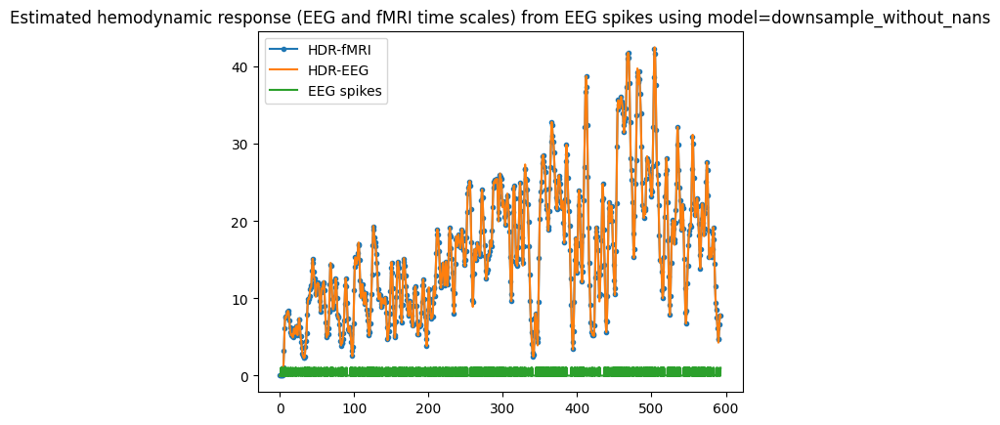

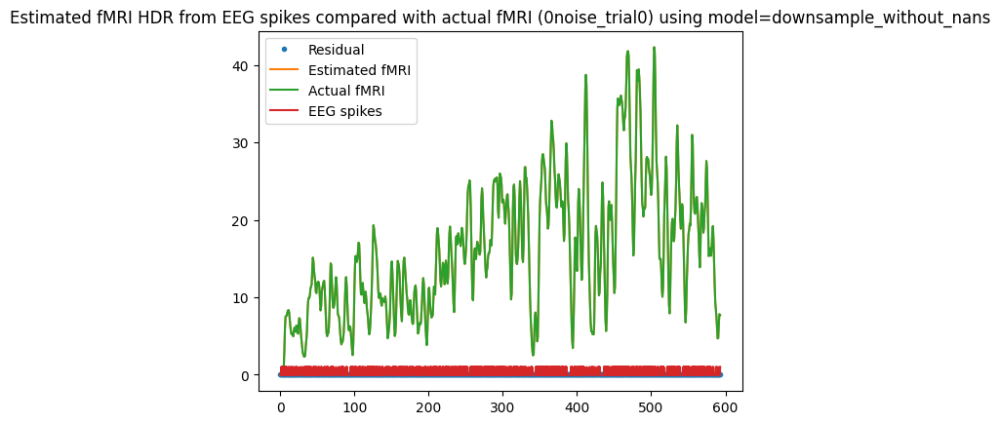

Residual Variance is 0.000000


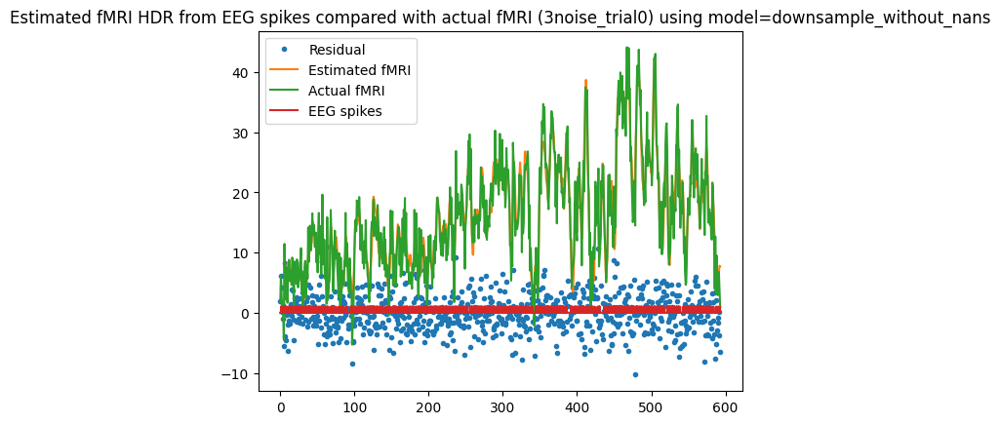

Residual Variance is 9.784428


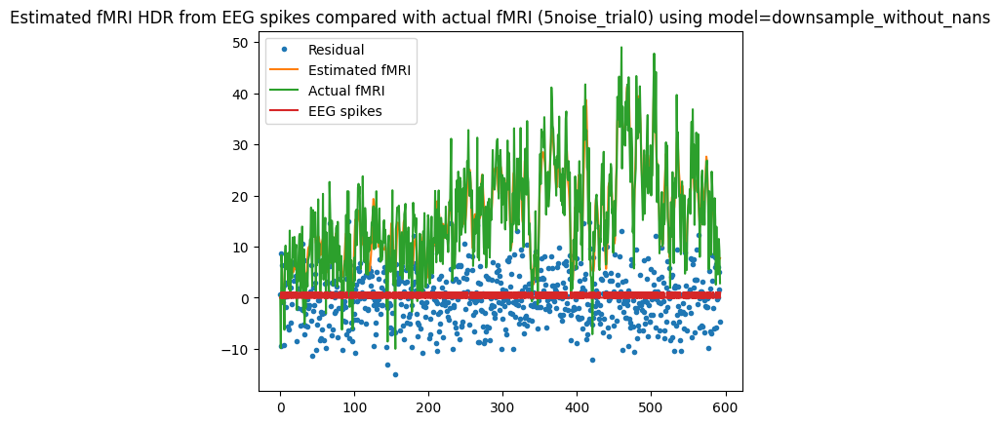

Residual Variance is 25.824006


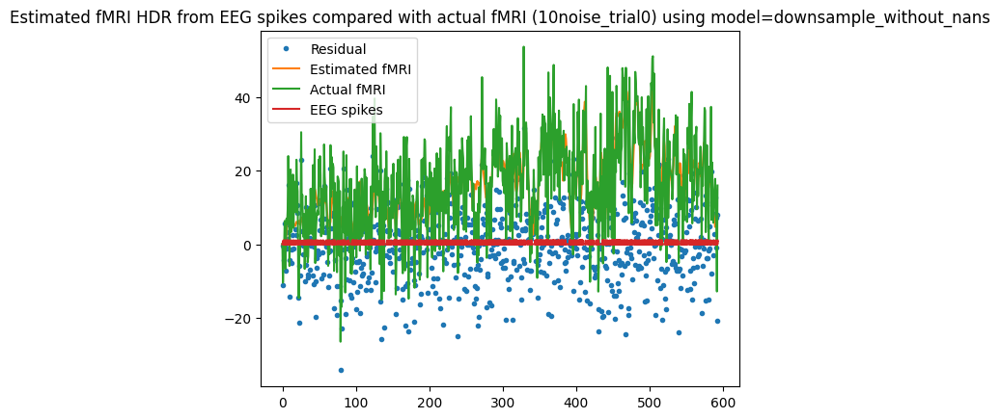

Residual Variance is 96.744131


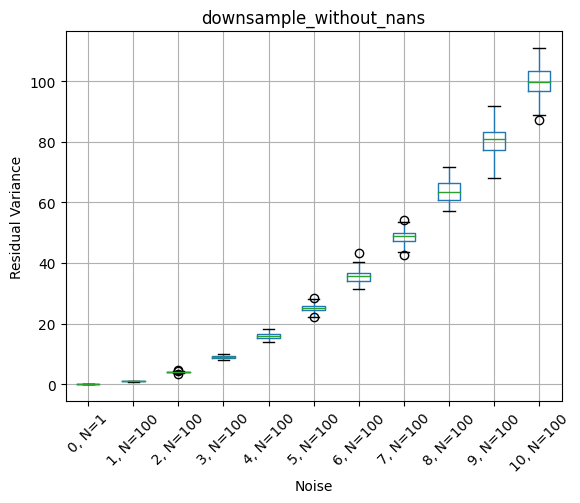

Scoring downsample_with_nans delta=2.25, tau=1.25, alpha=2


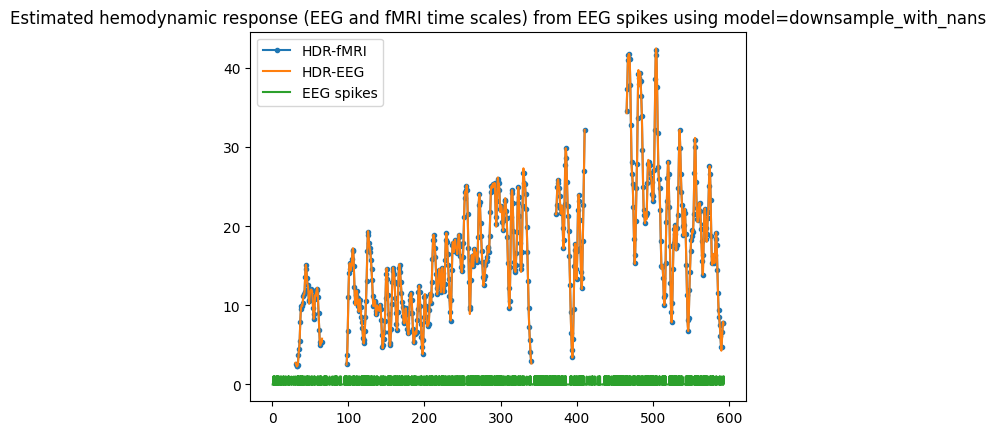

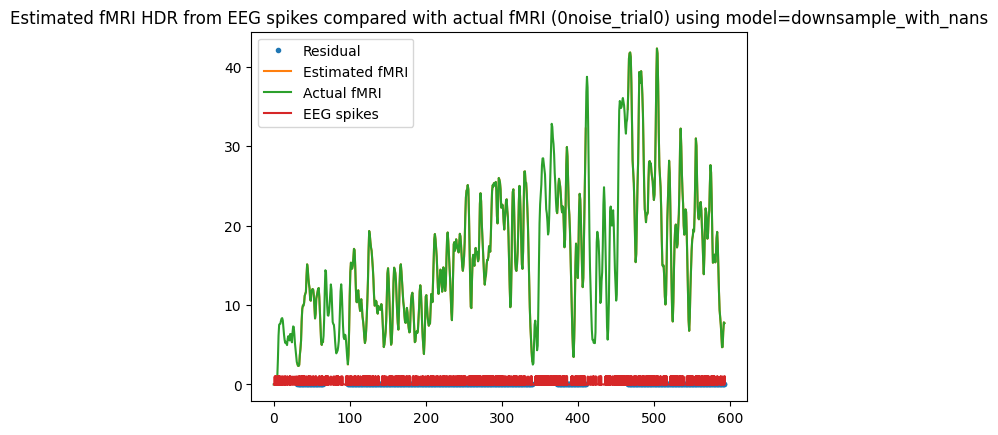

Residual Variance is 0.000000


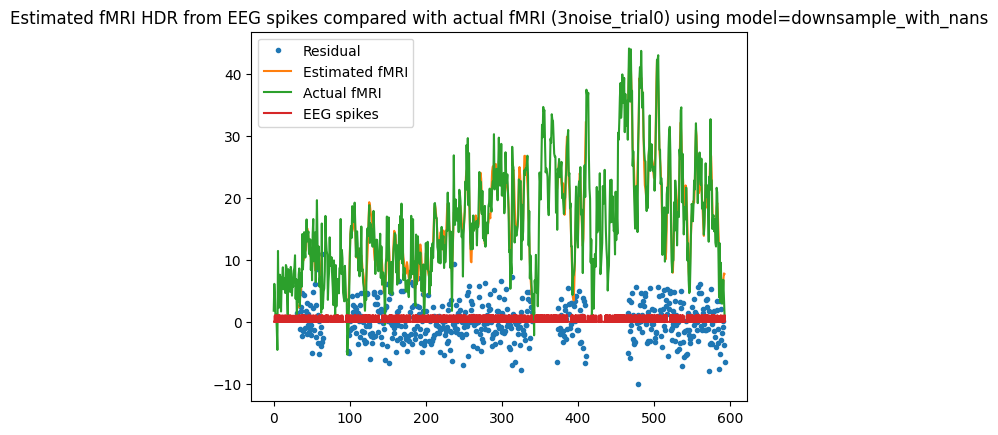

Residual Variance is 9.530163


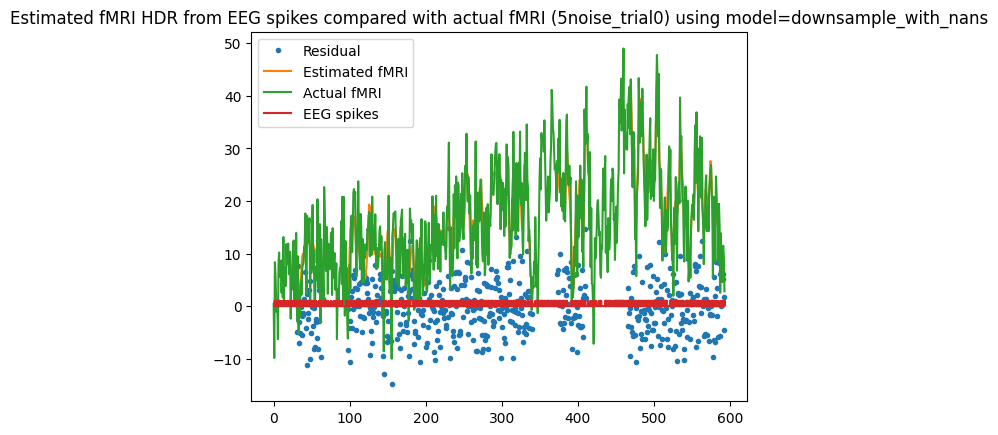

Residual Variance is 25.923183


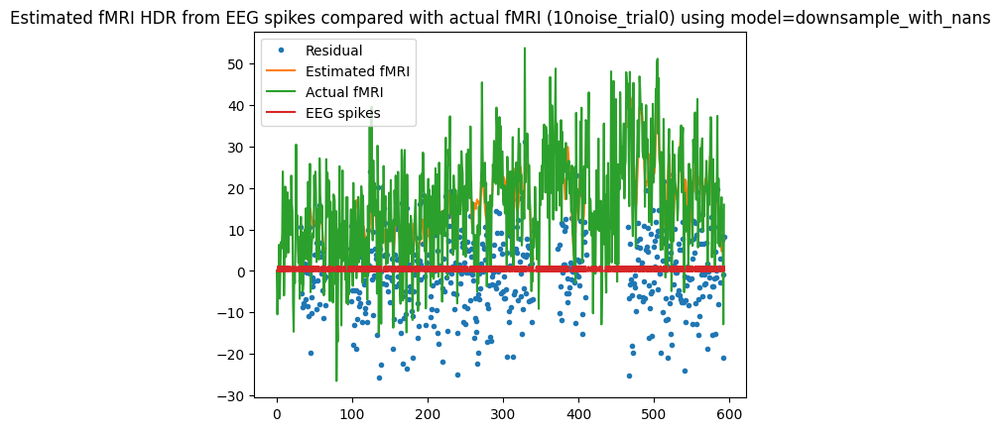

Residual Variance is 88.658256


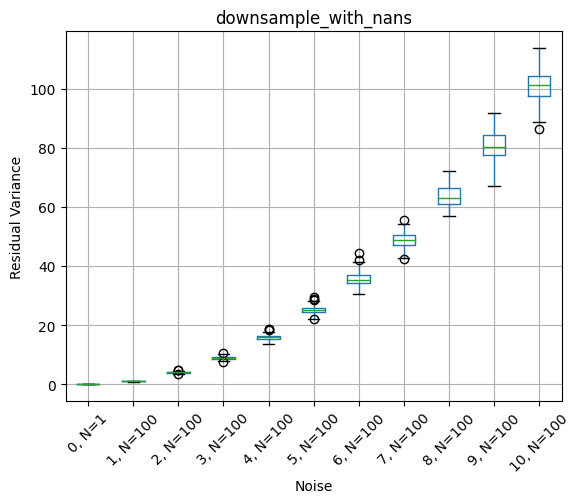

Scoring sum_without_nans delta=2.25, tau=1.25, alpha=2


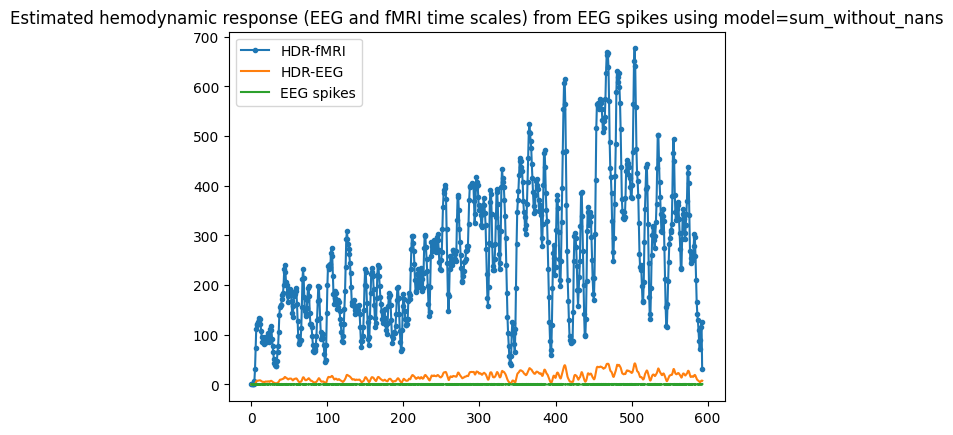

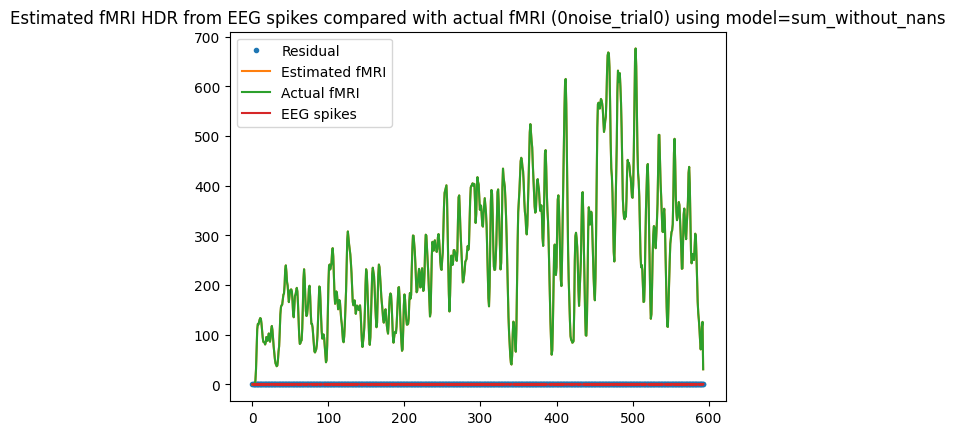

Residual Variance is 0.000000


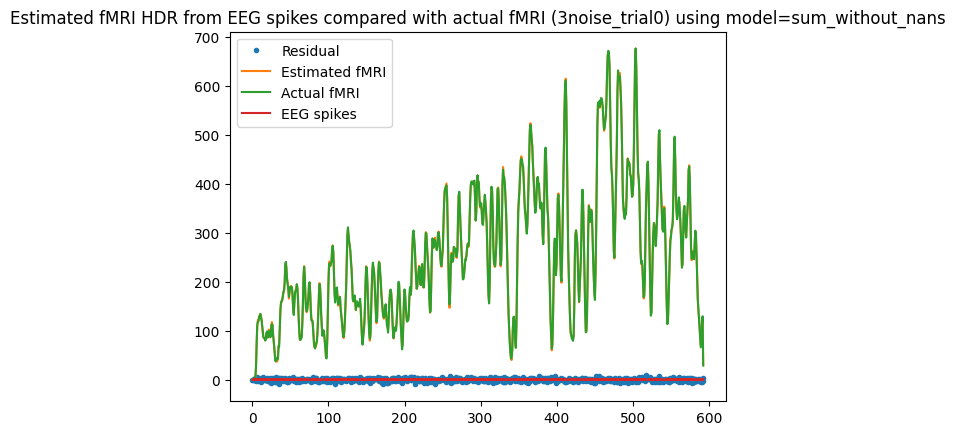

Residual Variance is 8.774468


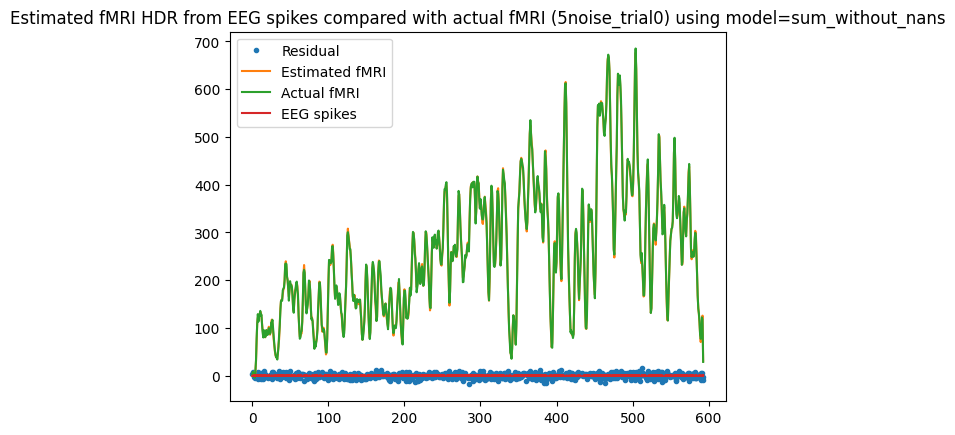

Residual Variance is 24.687653


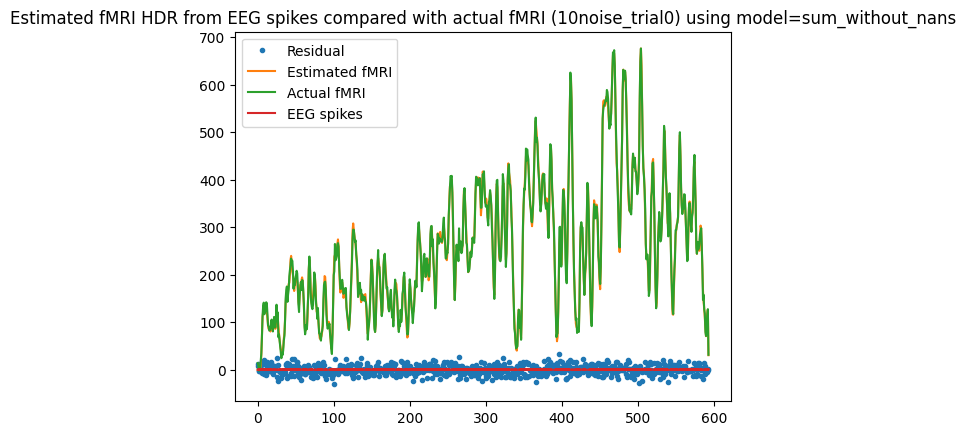

Residual Variance is 96.847878


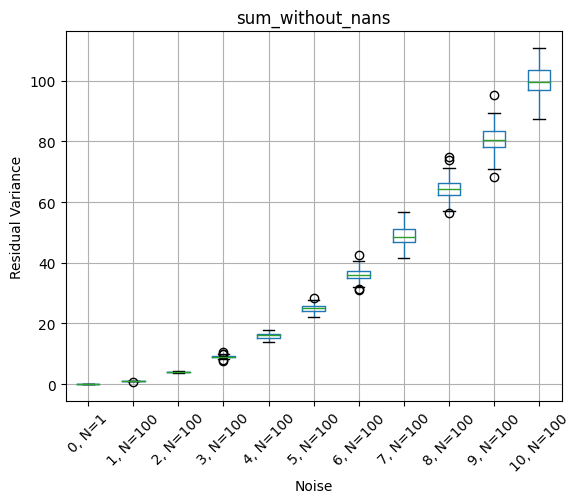

Scoring sum_with_nans delta=2.25, tau=1.25, alpha=2


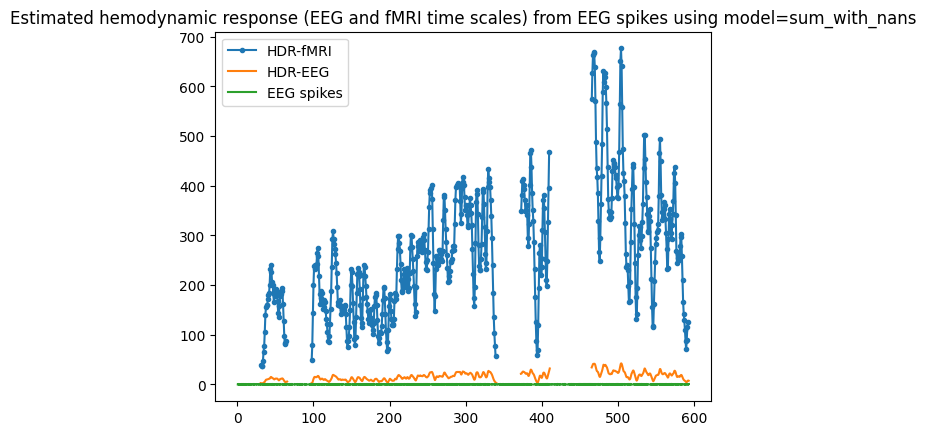

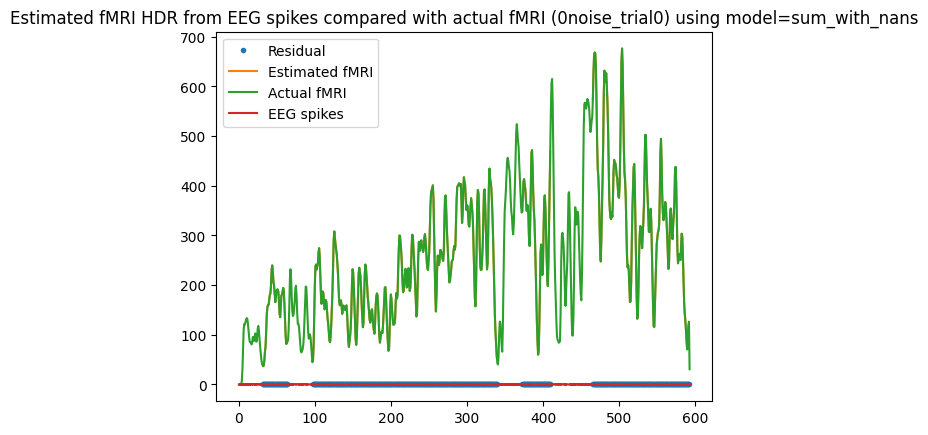

Residual Variance is 0.000000


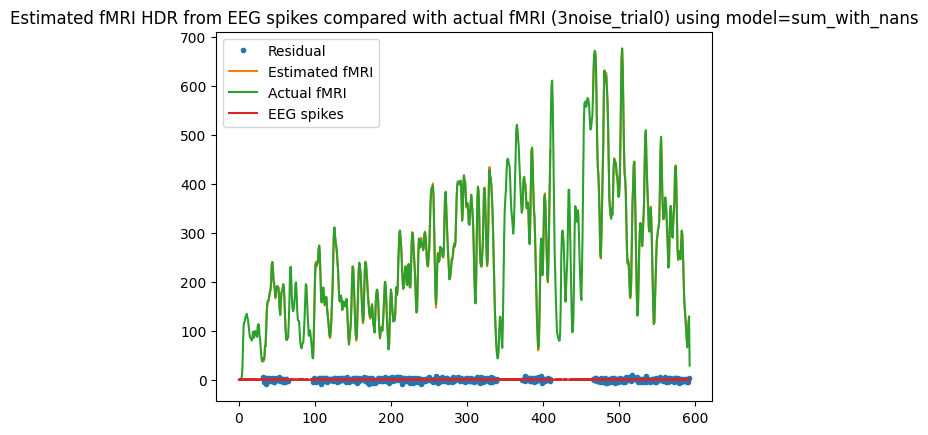

Residual Variance is 8.966742


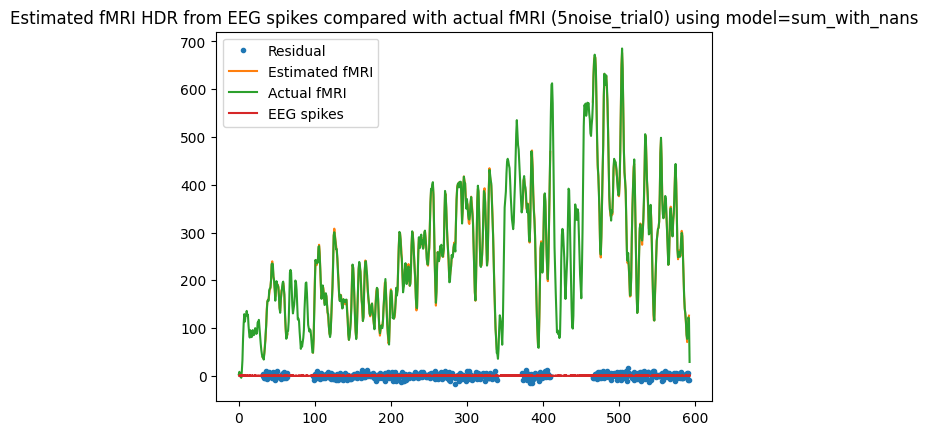

Residual Variance is 25.916620


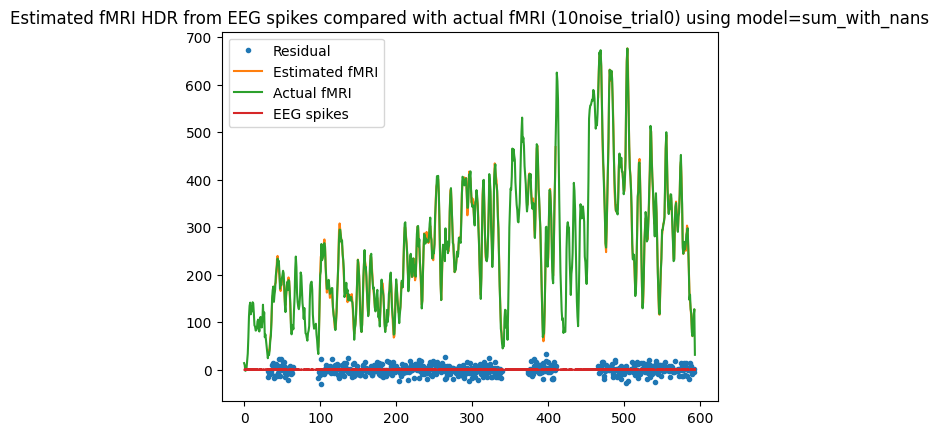

Residual Variance is 97.142646


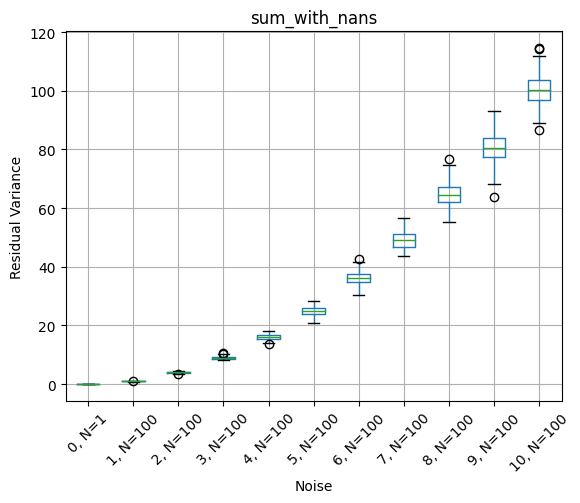

In [9]:
# Get in-depth plots for actual delta, tau, alpha
for model_name, model in models.items():
    residual_var = model.score(expected_delta, expected_tau, expected_alpha)
    fmri_names = np.array(model.fmri.voxel_names)
    if (fmri_names == None).any():
        print(f'Residual variance was {residual_var}')
    else:
        noise_levels = np.char.replace(fmri_names, 'perfect', '0noise_trail0')
        noise_levels = np.char.partition(noise_levels, sep='noise')
        res_var_df = pd.DataFrame(zip(noise_levels[:,0].astype(int), residual_var), columns=['Noise', 'res_var'])
        res_var_by_noise = res_var_df.groupby('Noise')
        _, axs = plt.subplots()
        axs.set_title(model_name)
        axs.set_ylabel('Residual Variance')
        axs.set_xlabel('Noise')
        axs = res_var_by_noise.boxplot(column='res_var', subplots=False, rot=45, ax=axs)
        labels = res_var_by_noise.count()
        labels = [f'{noise}, N={n.item()}' for noise, n in zip(labels.index, labels.values)]
        plt.setp(axs, xticklabels=labels)
        plt.show()
    model.plot = False


## Generate/Load the full dataset

In [10]:
# Optional Reuse functionality

df = pd.DataFrame()
descriptions = []

if try_to_reuse:
    matching_files = sorted(glob.glob(f'{filename_substring}*{filename_ext}'))
    filename_to_use = "none"
    if len(matching_files) != 0:
        filename_to_use = input(
            f'Found previously run data. Enter name to reuse or "none" to recalculate.'
            f'\n{matching_files}\nDefault ({matching_files[-1]})\n'
        )
    if filename_to_use.lower() != "none":
        if filename_to_use.strip() == '':
            filename_to_use = matching_files[-1]
        print(f'Loading data from {filename_to_use}...')
        with open(filename_to_use, 'r') as f:
            df = pd.read_csv(f, index_col=0)
        descriptions = generate_descriptions_from_search_df(df, models)


Found previously run data. Enter name to reuse or "none" to recalculate.
['effect_of_step_size_step_32_2023-04-06_19:15.csv']
Default (effect_of_step_size_step_32_2023-04-06_19:15.csv)

Loading data from effect_of_step_size_step_32_2023-04-06_19:15.csv...


In [11]:
if df.empty:
    print('Generating data!')
    descriptions, df = search_voxels(models, delta, tau, alpha)
    with open(f'{filename_substring}_{datetime.now().strftime("%Y-%m-%d_%H:%M")}{filename_ext}', 'w') as f:
        pd.DataFrame(df).to_csv(f)
    for model_name, description in zip(models.keys(), descriptions):
        with open(f'{model_name}_summary_{filename_substring}_{datetime.now().strftime("%Y-%m-%d_%H:%M")}{filename_ext}', 'w') as f:
            pd.DataFrame(description).transpose().to_csv(f)

## Cost by Noise

### Downsample without Missing Data

Minimal Cost for Average Cost: noise 1 (downsample_without_nans) = 0.9981998451127845; at
          delta       tau     alpha
79820  2.225806  1.233871  2.056452


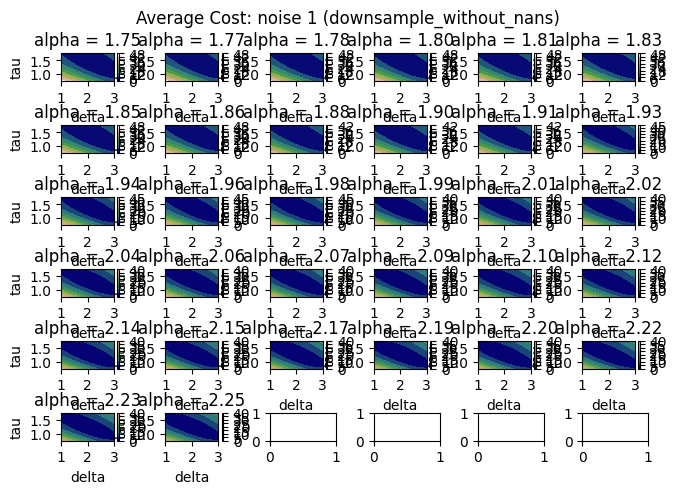

Minimal Cost for Average Cost: noise 2 (downsample_without_nans) = 3.991766721270861; at
          delta       tau     alpha
79820  2.225806  1.233871  2.056452


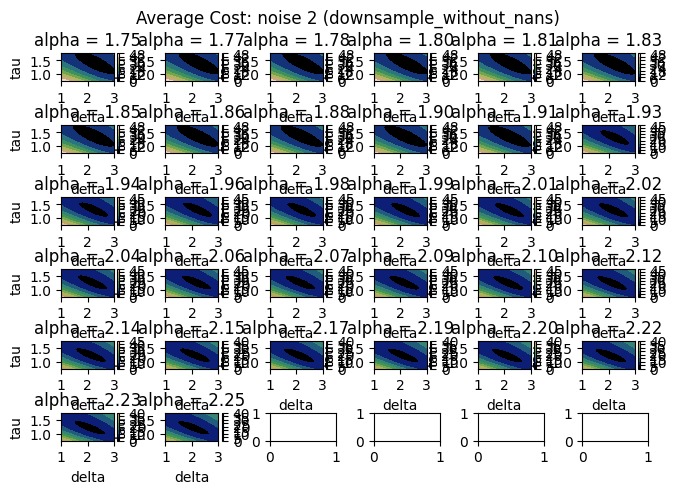

Minimal Cost for Average Cost: noise 3 (downsample_without_nans) = 9.042589559564867; at
          delta       tau     alpha
79816  2.225806  1.233871  2.040323


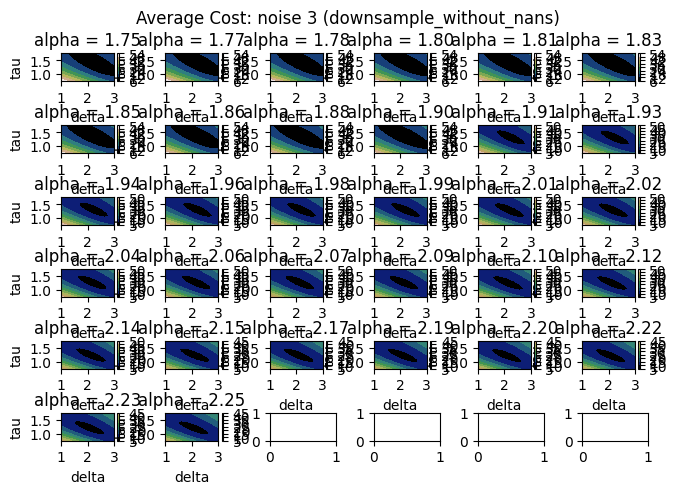

Minimal Cost for Average Cost: noise 4 (downsample_without_nans) = 16.07563466395343; at
          delta       tau     alpha
79820  2.225806  1.233871  2.056452


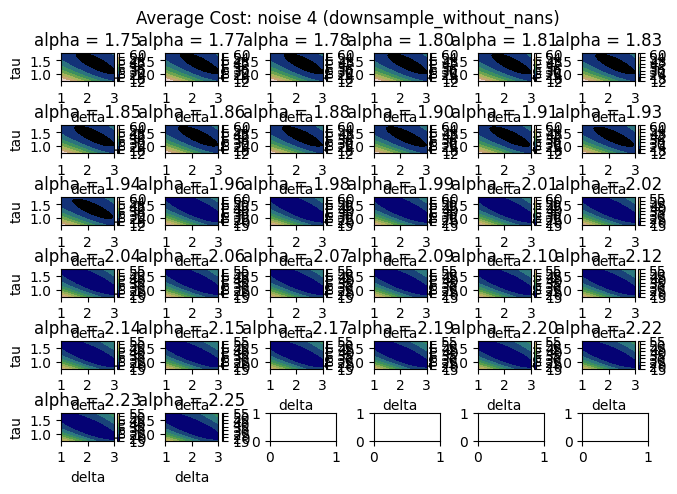

Minimal Cost for Average Cost: noise 5 (downsample_without_nans) = 25.24388129094013; at
          delta       tau     alpha
79816  2.225806  1.233871  2.040323


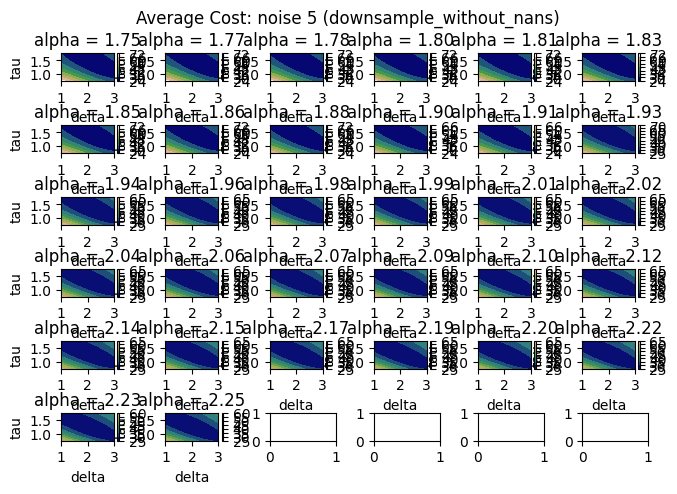

Minimal Cost for Average Cost: noise 6 (downsample_without_nans) = 35.84929672813367; at
          delta       tau     alpha
79816  2.225806  1.233871  2.040323


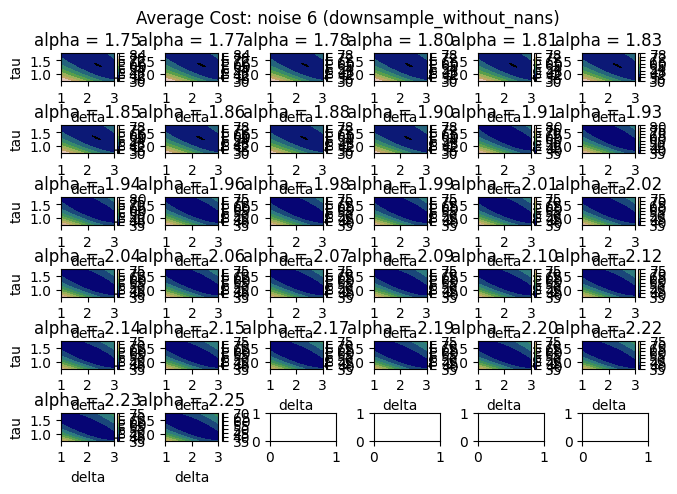

Minimal Cost for Average Cost: noise 7 (downsample_without_nans) = 48.7906272256313; at
          delta       tau     alpha
79816  2.225806  1.233871  2.040323


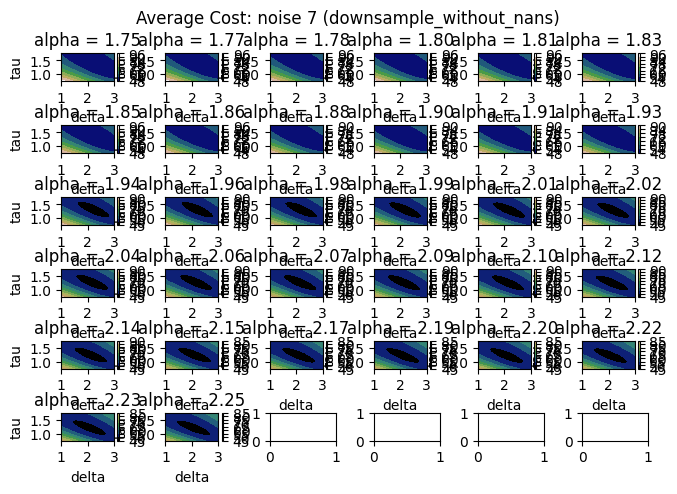

Minimal Cost for Average Cost: noise 8 (downsample_without_nans) = 64.10258470776444; at
          delta       tau     alpha
71544  2.096774  1.201613  2.233871


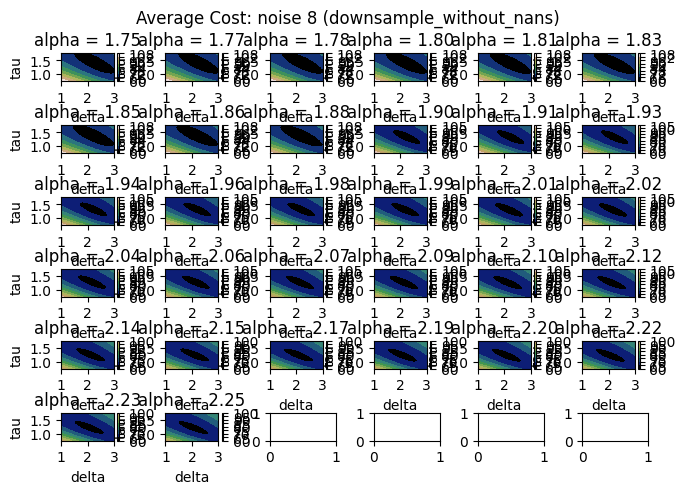

Minimal Cost for Average Cost: noise 9 (downsample_without_nans) = 80.87695303797308; at
          delta       tau     alpha
79816  2.225806  1.233871  2.040323


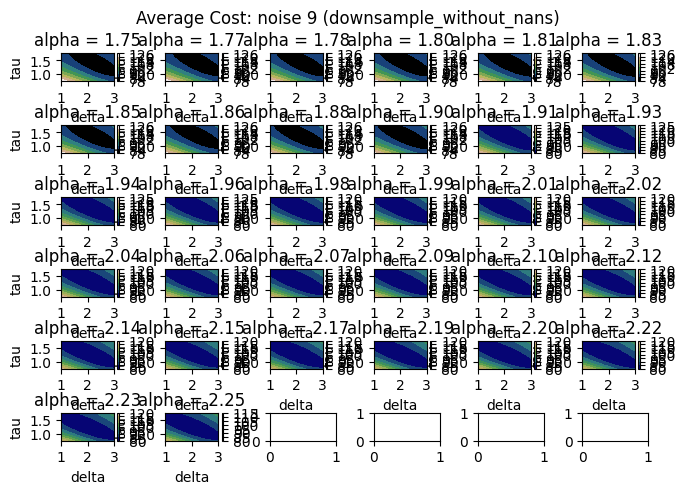

Minimal Cost for Average Cost: noise 10 (downsample_without_nans) = 100.55469670287131; at
          delta       tau     alpha
83904  2.290323  1.233871  2.008065


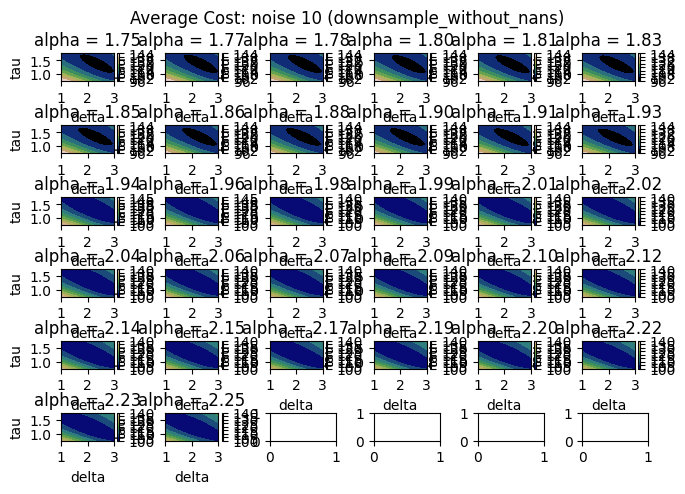

In [12]:
model_name = 'downsample_without_nans'
for noise in noise_range:
    df_to_plot = df[df['model_name'] == model_name].drop(columns='model_name')
    columns_to_choose = np.char.startswith(df_to_plot.columns.to_numpy().astype(str), f'{noise}noise')
    columns_for_noise = df_to_plot.columns[columns_to_choose]

    average_df = df_to_plot.loc[:,['delta', 'tau', 'alpha']]
    average_df[f'Average Cost: noise {noise} ({model_name})'] = df_to_plot[columns_for_noise].mean(axis=1)
    plot_all_search_results_2d(average_df, separate_by='alpha')

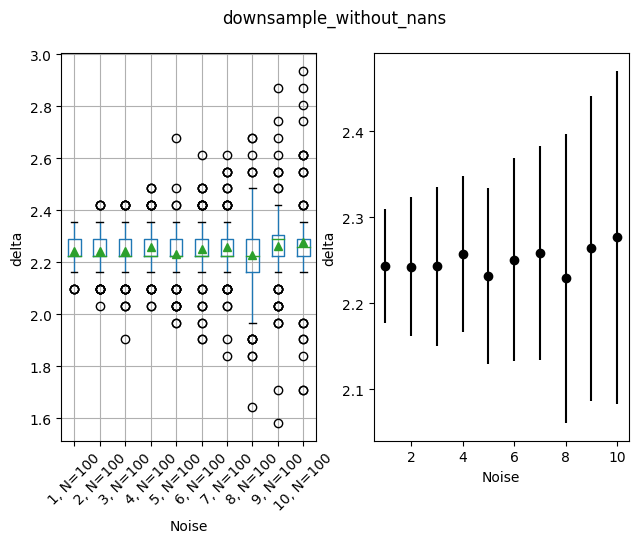

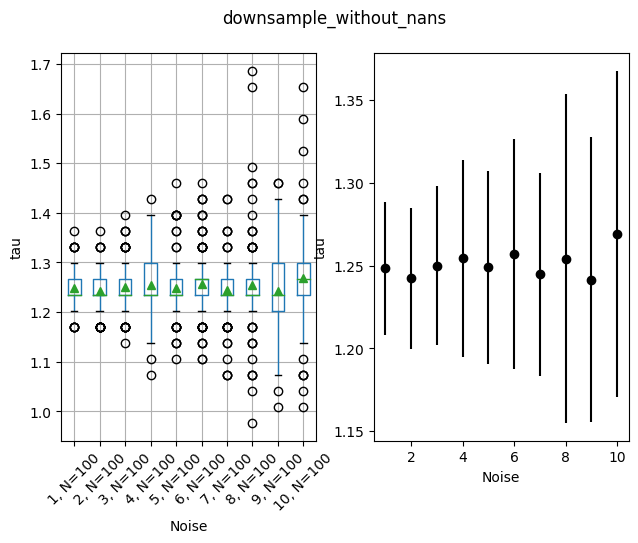

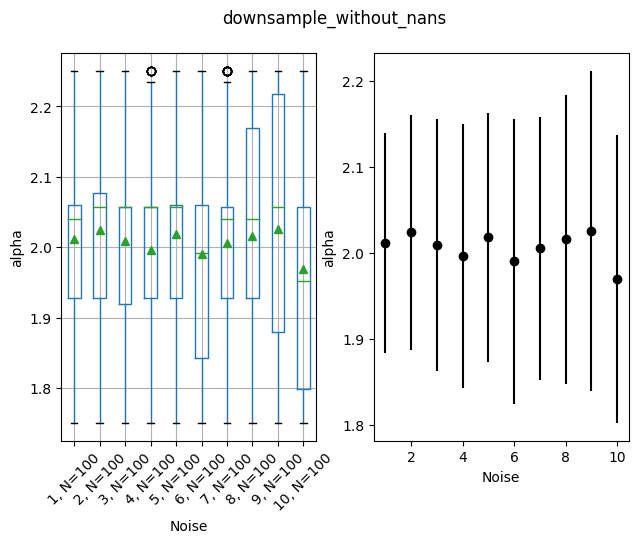

In [13]:
data = []
df_to_plot = df[df['model_name'] == model_name].drop(columns='model_name')
for noise in noise_range:
    columns_to_choose = np.char.startswith(df_to_plot.columns.to_numpy().astype(str), f'{noise}noise')
    columns_for_noise = df_to_plot.columns[columns_to_choose]
    for point in zip(*np.where(~np.isnan(df[columns_for_noise][df[columns_for_noise] == df[columns_for_noise].min()].to_numpy()))):
        row_of_interest = df.iloc[point[0]]
        data.append([row_of_interest['delta'], row_of_interest['tau'], row_of_interest['alpha'], noise])

chosen_points = pd.DataFrame(data, columns=['delta', 'tau', 'alpha', 'noise']).groupby('noise')

for variable in ['delta', 'tau', 'alpha']:
    fig, axs = plt.subplots(1, 2)
    fig.suptitle(model_name)
    fig.tight_layout()
    axs[0].set_ylabel(variable)
    axs[0].set_xlabel('Noise')
    axs[0] = chosen_points.boxplot(subplots=False, column=variable, rot=45, ax=axs[0], showmeans=True)
    axs[1].set_ylabel(variable)
    axs[1].set_xlabel('Noise')
    axs[1].errorbar(noise_range, chosen_points.mean()[variable], chosen_points.std()[variable], fmt='ok')
    labels = chosen_points.count()
    labels = [f'{noise}, N={n[0].item()}' for noise, n in zip(labels.index, labels.values)]
    plt.setp(axs[0], xticklabels=labels)
    plt.show()

### Downsample with Missing Data

Minimal Cost for Average Cost: noise 1 (downsample_with_nans) = 0.9904356864307279; at
          delta       tau     alpha
79821  2.225806  1.233871  2.056452


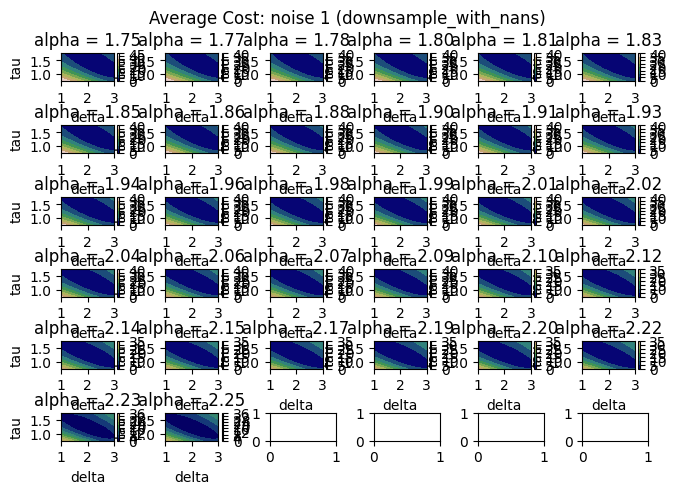

Minimal Cost for Average Cost: noise 2 (downsample_with_nans) = 3.990254734033089; at
          delta       tau     alpha
79821  2.225806  1.233871  2.056452


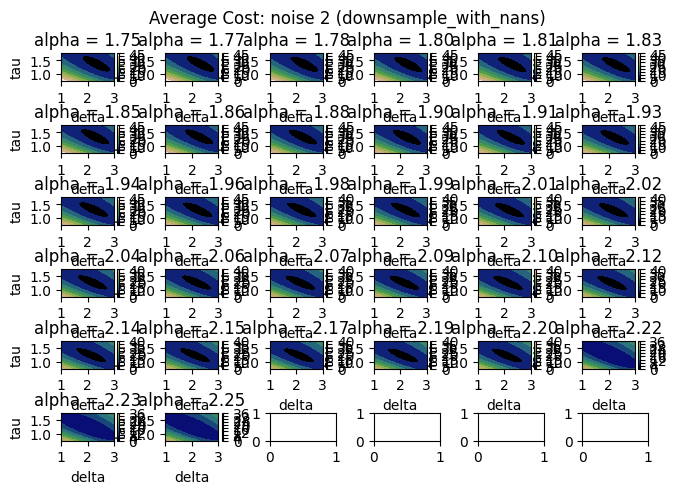

Minimal Cost for Average Cost: noise 3 (downsample_with_nans) = 9.051410148611469; at
          delta       tau     alpha
79821  2.225806  1.233871  2.056452


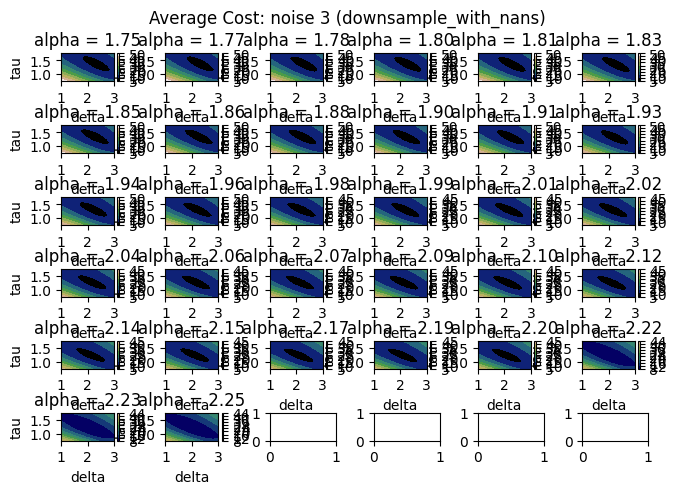

Minimal Cost for Average Cost: noise 4 (downsample_with_nans) = 16.15224443088964; at
          delta       tau     alpha
79821  2.225806  1.233871  2.056452


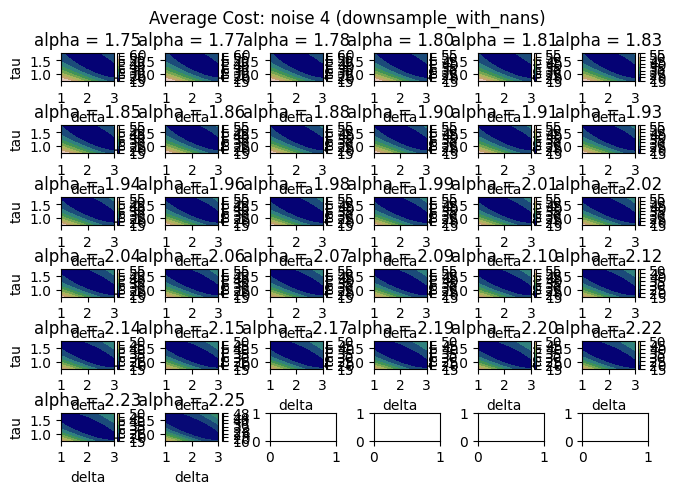

Minimal Cost for Average Cost: noise 5 (downsample_with_nans) = 25.240465876694444; at
          delta       tau     alpha
79817  2.225806  1.233871  2.040323


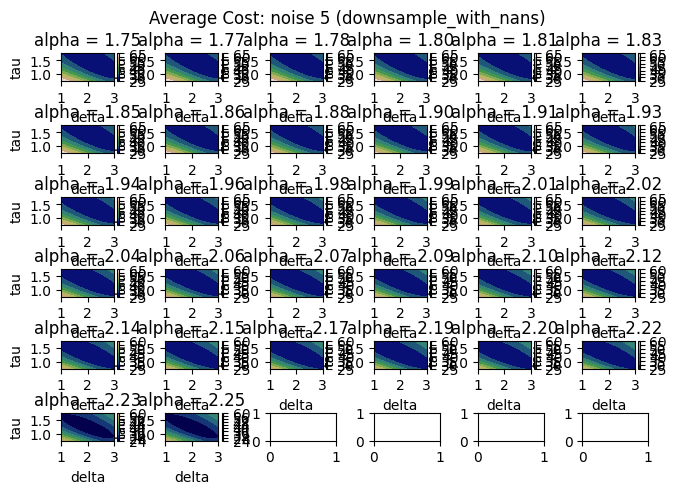

Minimal Cost for Average Cost: noise 6 (downsample_with_nans) = 35.999739382400215; at
          delta       tau     alpha
84013  2.290323  1.266129  1.927419


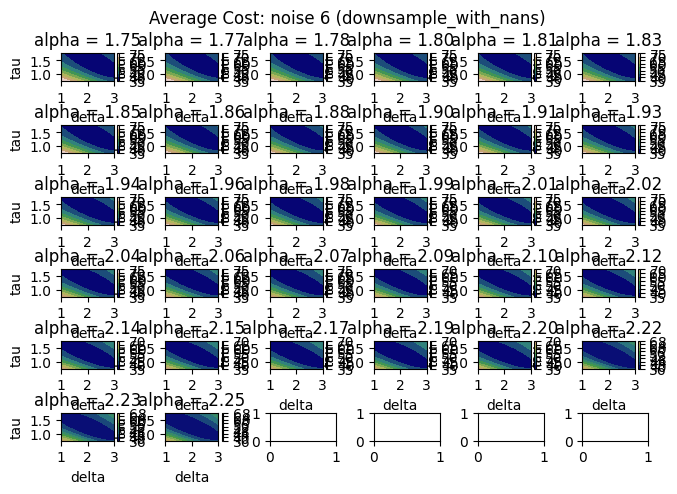

Minimal Cost for Average Cost: noise 7 (downsample_with_nans) = 49.18416536557354; at
         delta       tau     alpha
75625  2.16129  1.201613  2.169355


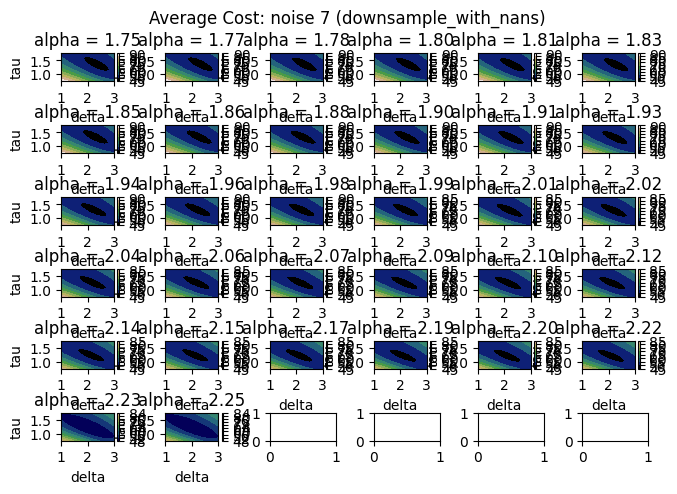

Minimal Cost for Average Cost: noise 8 (downsample_with_nans) = 64.11104166323156; at
          delta       tau  alpha
71549  2.096774  1.201613   2.25


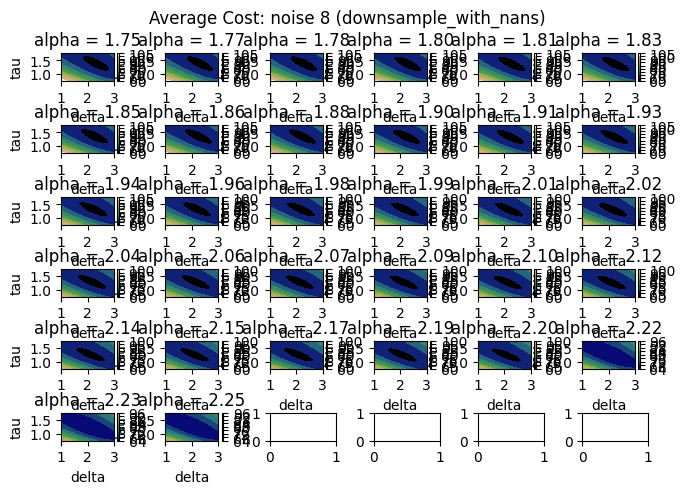

Minimal Cost for Average Cost: noise 9 (downsample_with_nans) = 81.23646429227533; at
          delta       tau     alpha
84017  2.290323  1.266129  1.943548


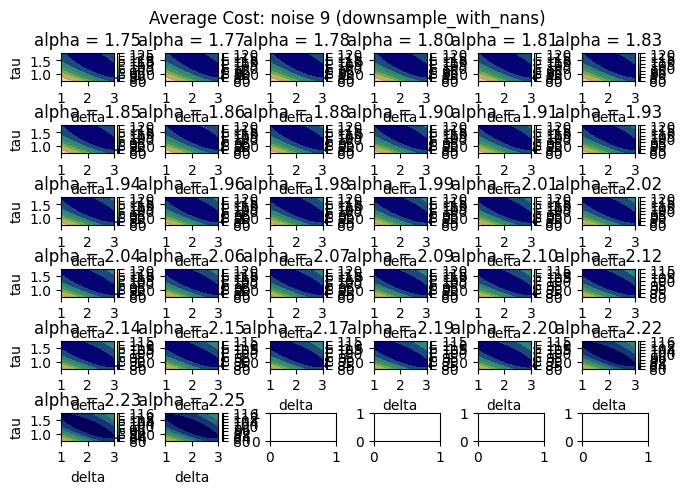

Minimal Cost for Average Cost: noise 10 (downsample_with_nans) = 100.41489534607054; at
          delta       tau     alpha
84017  2.290323  1.266129  1.943548


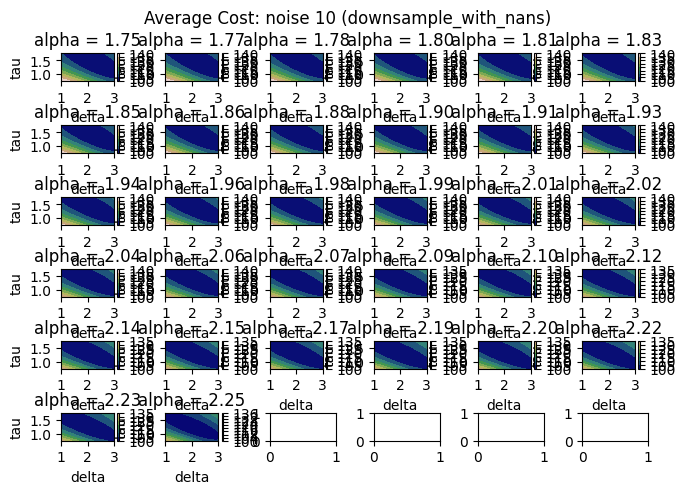

In [14]:
model_name = 'downsample_with_nans'
for noise in noise_range:
    df_to_plot = df[df['model_name'] == model_name].drop(columns='model_name')
    columns_to_choose = np.char.startswith(df_to_plot.columns.to_numpy().astype(str), f'{noise}noise')
    columns_for_noise = df_to_plot.columns[columns_to_choose]

    average_df = df_to_plot.loc[:,['delta', 'tau', 'alpha']]
    average_df[f'Average Cost: noise {noise} ({model_name})'] = df_to_plot[columns_for_noise].mean(axis=1)
    plot_all_search_results_2d(average_df, separate_by='alpha')

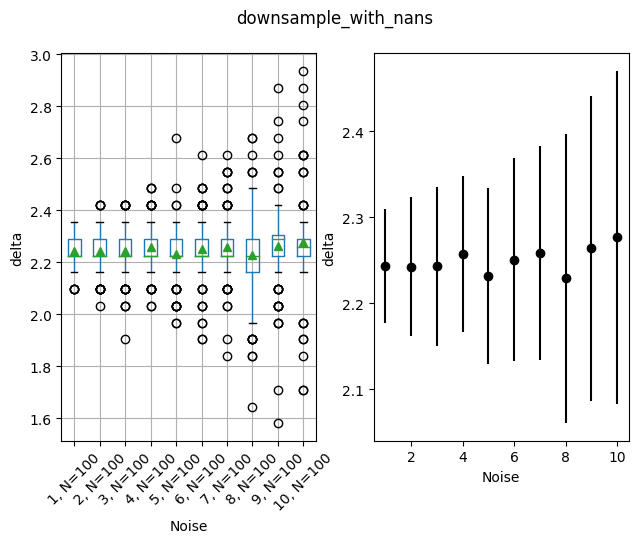

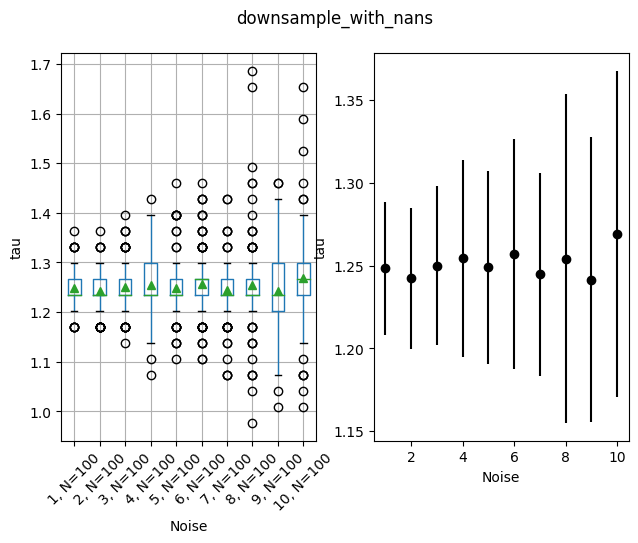

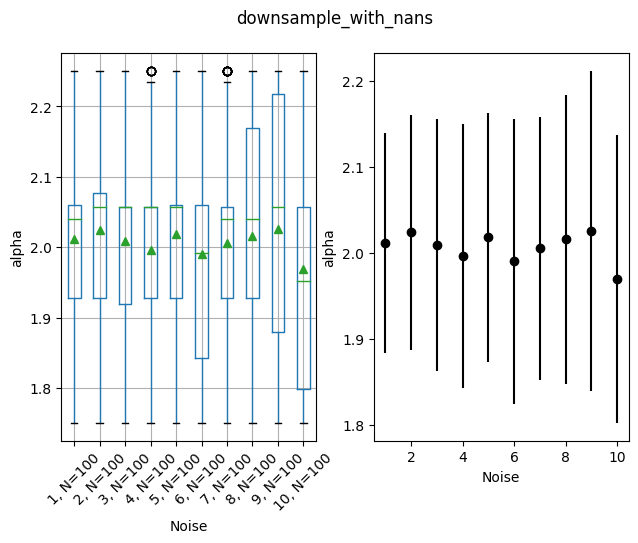

In [15]:
data = []
df_to_plot = df[df['model_name'] == model_name].drop(columns='model_name')
for noise in noise_range:
    columns_to_choose = np.char.startswith(df_to_plot.columns.to_numpy().astype(str), f'{noise}noise')
    columns_for_noise = df_to_plot.columns[columns_to_choose]
    for point in zip(*np.where(~np.isnan(df[columns_for_noise][df[columns_for_noise] == df[columns_for_noise].min()].to_numpy()))):
        row_of_interest = df.iloc[point[0]]
        data.append([row_of_interest['delta'], row_of_interest['tau'], row_of_interest['alpha'], noise])

chosen_points = pd.DataFrame(data, columns=['delta', 'tau', 'alpha', 'noise']).groupby('noise')

for variable in ['delta', 'tau', 'alpha']:
    fig, axs = plt.subplots(1, 2)
    fig.suptitle(model_name)
    fig.tight_layout()
    axs[0].set_ylabel(variable)
    axs[0].set_xlabel('Noise')
    axs[0] = chosen_points.boxplot(subplots=False, column=variable, rot=45, ax=axs[0], showmeans=True)
    axs[1].set_ylabel(variable)
    axs[1].set_xlabel('Noise')
    axs[1].errorbar(noise_range, chosen_points.mean()[variable], chosen_points.std()[variable], fmt='ok')
    labels = chosen_points.count()
    labels = [f'{noise}, N={n[0].item()}' for noise, n in zip(labels.index, labels.values)]
    plt.setp(axs[0], xticklabels=labels)
    plt.show()

### Sum without Missing Data

Minimal Cost for Average Cost: noise 1 (sum_without_nans) = 1.080778625628986; at
          delta       tau     alpha
79822  2.225806  1.233871  2.056452


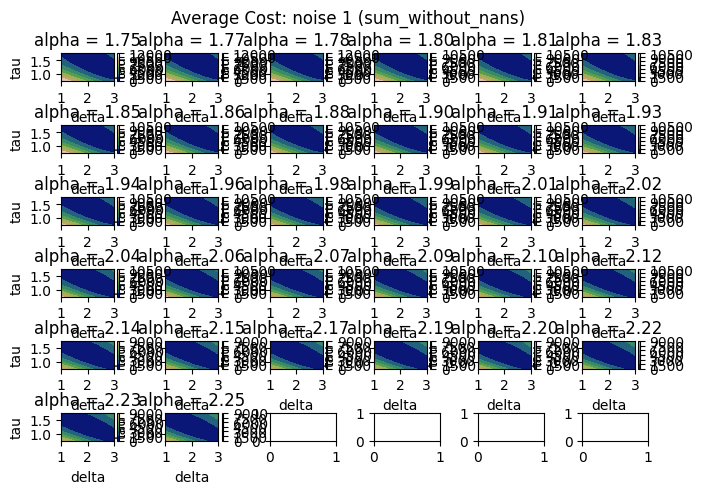

Minimal Cost for Average Cost: noise 2 (sum_without_nans) = 4.108337956156835; at
          delta       tau     alpha
79822  2.225806  1.233871  2.056452


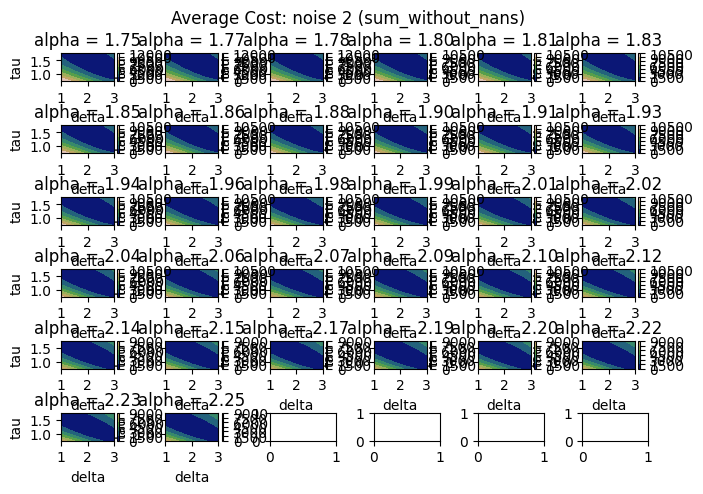

Minimal Cost for Average Cost: noise 3 (sum_without_nans) = 9.08608773251705; at
          delta       tau     alpha
79822  2.225806  1.233871  2.056452


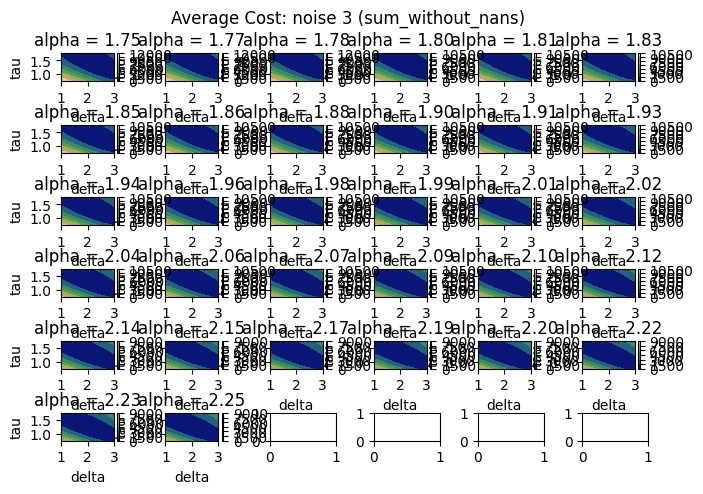

Minimal Cost for Average Cost: noise 4 (sum_without_nans) = 16.11446683414011; at
          delta       tau     alpha
79822  2.225806  1.233871  2.056452


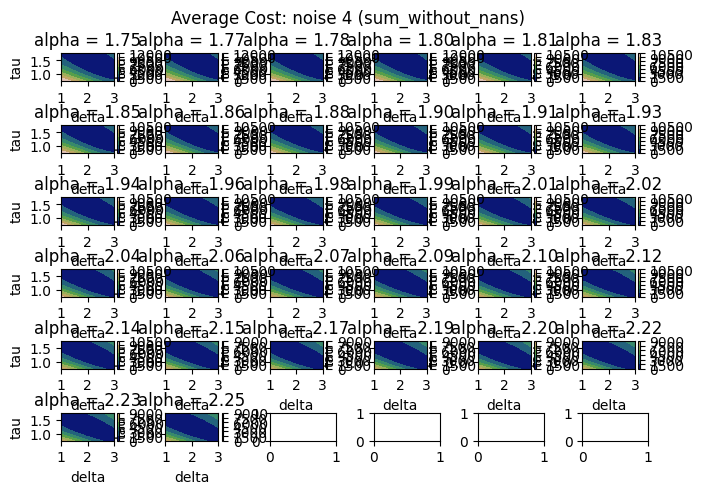

Minimal Cost for Average Cost: noise 5 (sum_without_nans) = 25.10142524873746; at
          delta       tau     alpha
79822  2.225806  1.233871  2.056452


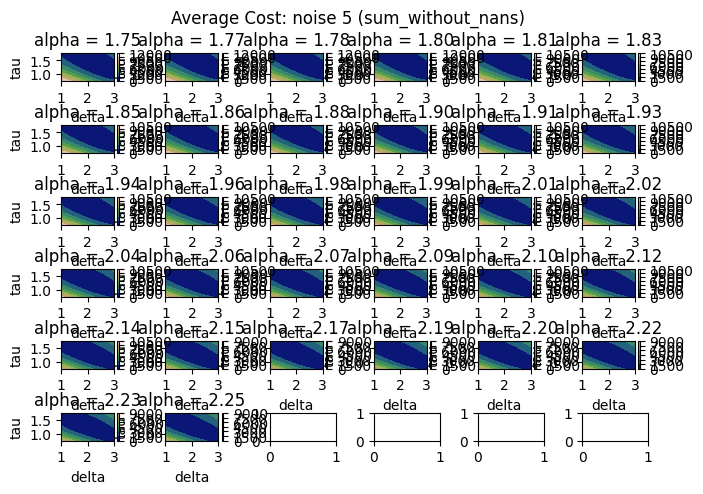

Minimal Cost for Average Cost: noise 6 (sum_without_nans) = 36.100368953793755; at
          delta       tau     alpha
79822  2.225806  1.233871  2.056452


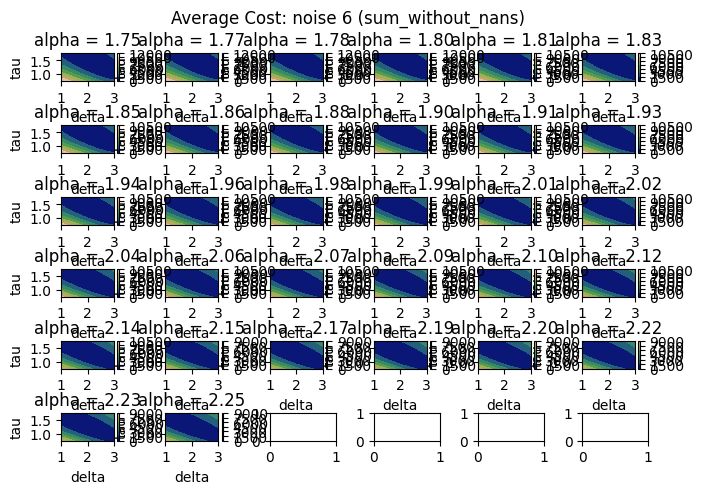

Minimal Cost for Average Cost: noise 7 (sum_without_nans) = 48.991477596330114; at
          delta       tau     alpha
79822  2.225806  1.233871  2.056452


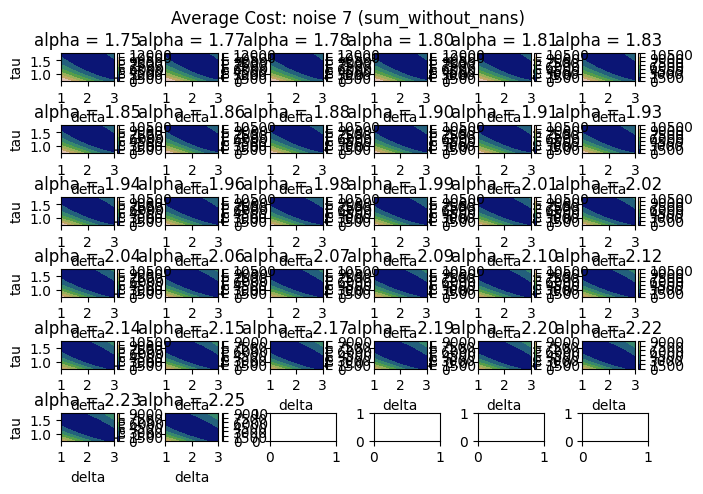

Minimal Cost for Average Cost: noise 8 (sum_without_nans) = 64.18470037263529; at
          delta       tau     alpha
79822  2.225806  1.233871  2.056452


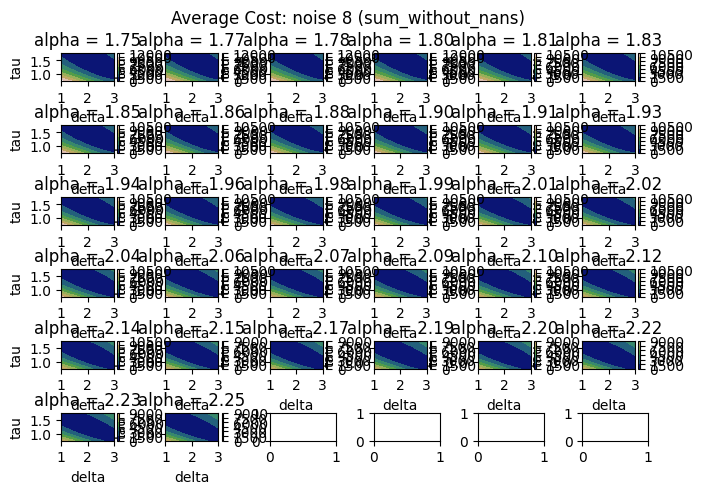

Minimal Cost for Average Cost: noise 9 (sum_without_nans) = 81.22294073001193; at
          delta       tau     alpha
79822  2.225806  1.233871  2.056452


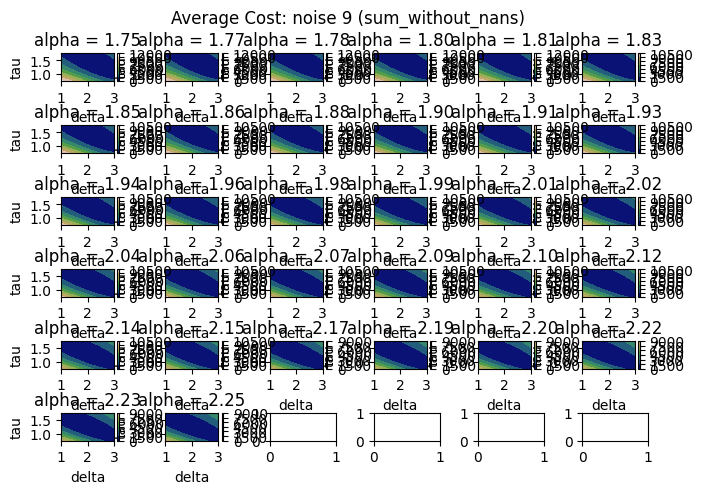

Minimal Cost for Average Cost: noise 10 (sum_without_nans) = 99.60610420026866; at
          delta       tau     alpha
79822  2.225806  1.233871  2.056452


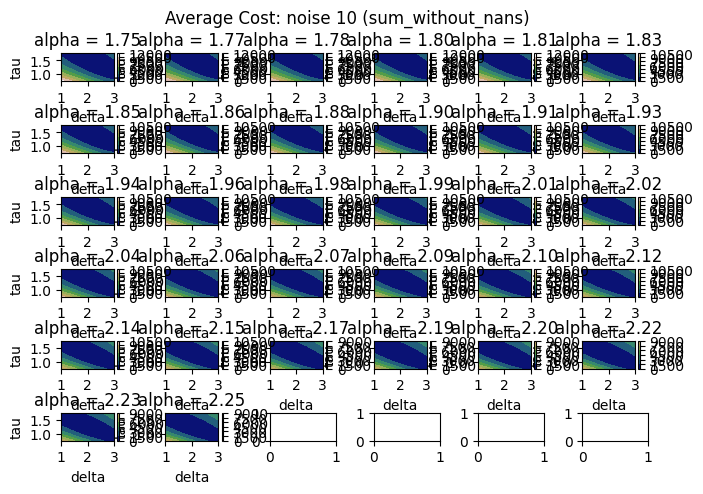

In [16]:
model_name = 'sum_without_nans'
for noise in noise_range:
    df_to_plot = df[df['model_name'] == model_name].drop(columns='model_name')
    columns_to_choose = np.char.startswith(df_to_plot.columns.to_numpy().astype(str), f'{noise}noise')
    columns_for_noise = df_to_plot.columns[columns_to_choose]

    average_df = df_to_plot.loc[:,['delta', 'tau', 'alpha']]
    average_df[f'Average Cost: noise {noise} ({model_name})'] = df_to_plot[columns_for_noise].mean(axis=1)
    plot_all_search_results_2d(average_df, separate_by='alpha')

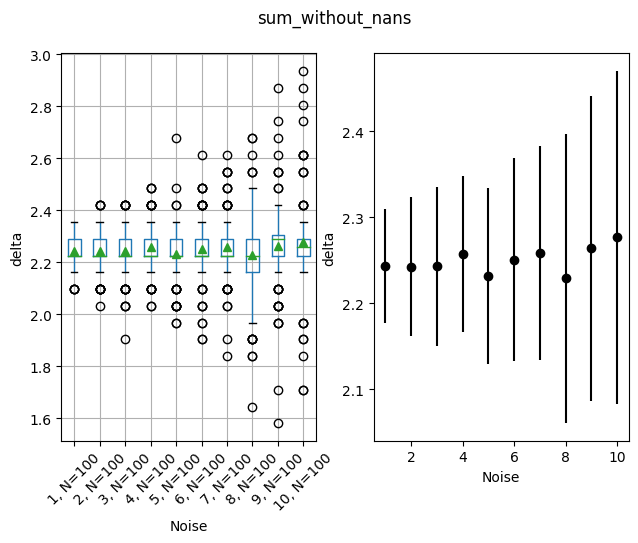

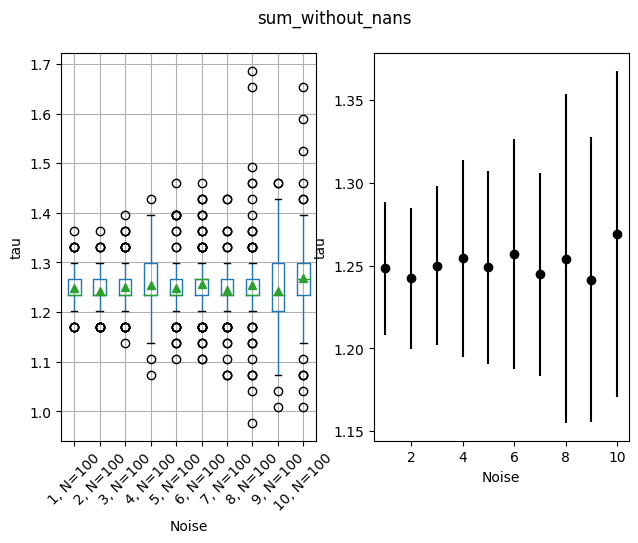

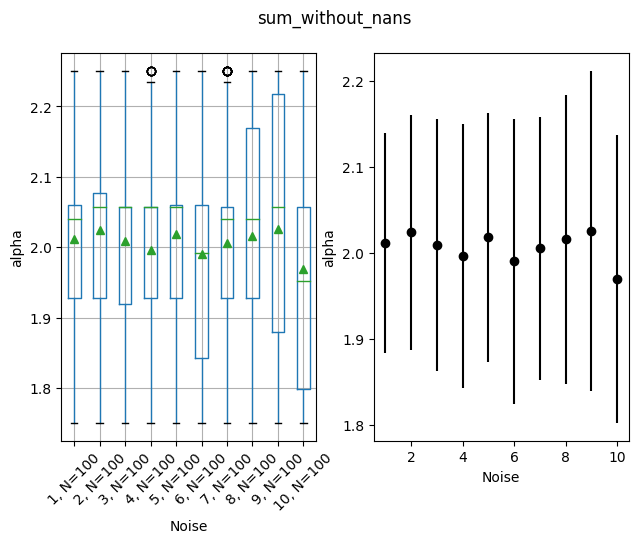

In [17]:
data = []
df_to_plot = df[df['model_name'] == model_name].drop(columns='model_name')
for noise in noise_range:
    columns_to_choose = np.char.startswith(df_to_plot.columns.to_numpy().astype(str), f'{noise}noise')
    columns_for_noise = df_to_plot.columns[columns_to_choose]
    for point in zip(*np.where(~np.isnan(df[columns_for_noise][df[columns_for_noise] == df[columns_for_noise].min()].to_numpy()))):
        row_of_interest = df.iloc[point[0]]
        data.append([row_of_interest['delta'], row_of_interest['tau'], row_of_interest['alpha'], noise])

chosen_points = pd.DataFrame(data, columns=['delta', 'tau', 'alpha', 'noise']).groupby('noise')

for variable in ['delta', 'tau', 'alpha']:
    fig, axs = plt.subplots(1, 2)
    fig.suptitle(model_name)
    fig.tight_layout()
    axs[0].set_ylabel(variable)
    axs[0].set_xlabel('Noise')
    axs[0] = chosen_points.boxplot(subplots=False, column=variable, rot=45, ax=axs[0], showmeans=True)
    axs[1].set_ylabel(variable)
    axs[1].set_xlabel('Noise')
    axs[1].errorbar(noise_range, chosen_points.mean()[variable], chosen_points.std()[variable], fmt='ok')
    labels = chosen_points.count()
    labels = [f'{noise}, N={n[0].item()}' for noise, n in zip(labels.index, labels.values)]
    plt.setp(axs[0], xticklabels=labels)
    plt.show()

### Sum with Missing Data

Minimal Cost for Average Cost: noise 1 (sum_with_nans) = 1.0805894879888174; at
          delta       tau     alpha
79823  2.225806  1.233871  2.056452


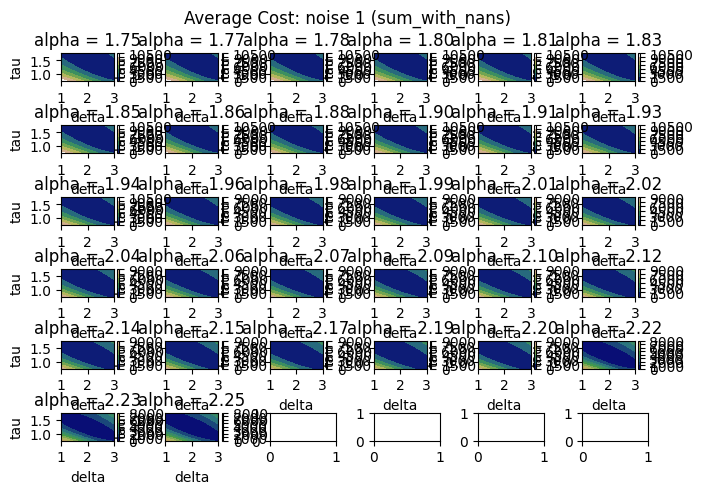

Minimal Cost for Average Cost: noise 2 (sum_with_nans) = 4.124208097636529; at
          delta       tau     alpha
79823  2.225806  1.233871  2.056452


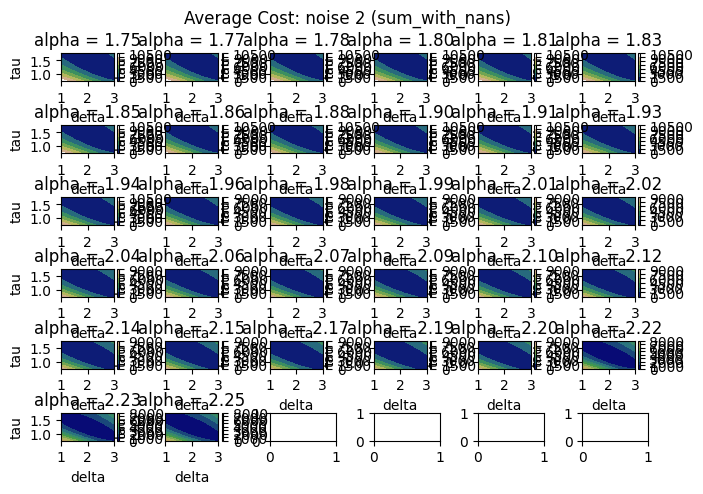

Minimal Cost for Average Cost: noise 3 (sum_with_nans) = 9.096634820040707; at
          delta       tau     alpha
79823  2.225806  1.233871  2.056452


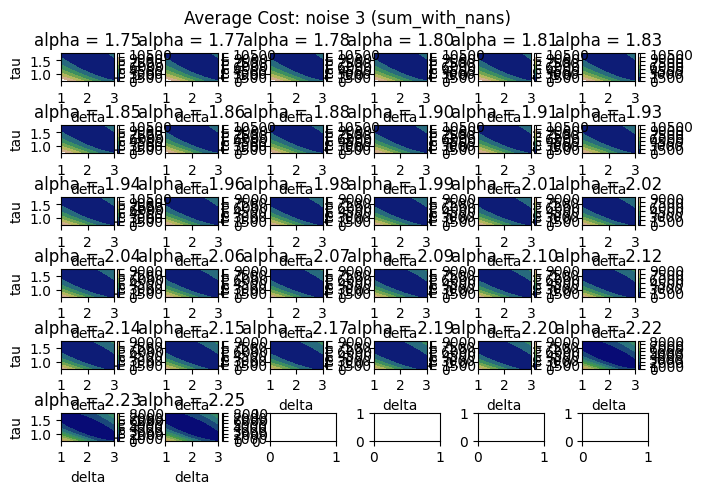

Minimal Cost for Average Cost: noise 4 (sum_with_nans) = 16.133198296394074; at
          delta       tau     alpha
79823  2.225806  1.233871  2.056452


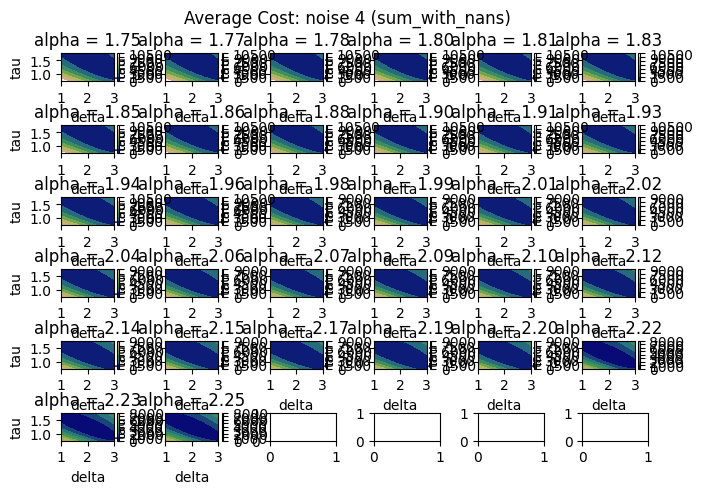

Minimal Cost for Average Cost: noise 5 (sum_with_nans) = 25.055810398485093; at
          delta       tau     alpha
79823  2.225806  1.233871  2.056452


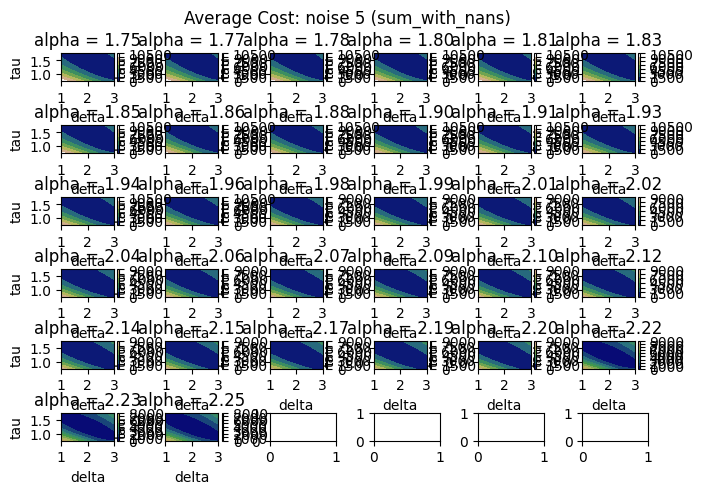

Minimal Cost for Average Cost: noise 6 (sum_with_nans) = 35.978275165772935; at
          delta       tau     alpha
79823  2.225806  1.233871  2.056452


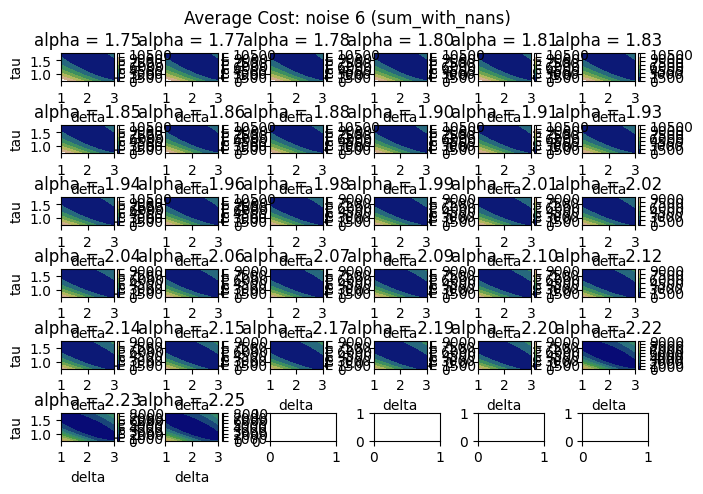

Minimal Cost for Average Cost: noise 7 (sum_with_nans) = 49.177476414342266; at
          delta       tau     alpha
79823  2.225806  1.233871  2.056452


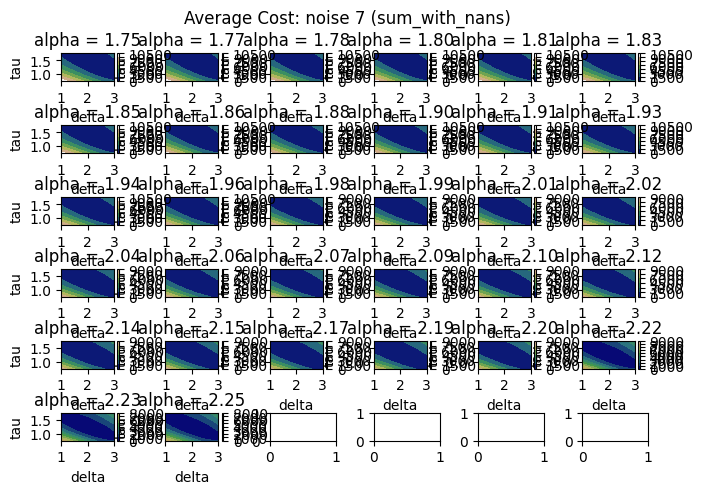

Minimal Cost for Average Cost: noise 8 (sum_with_nans) = 64.08187551956684; at
          delta       tau     alpha
79823  2.225806  1.233871  2.056452


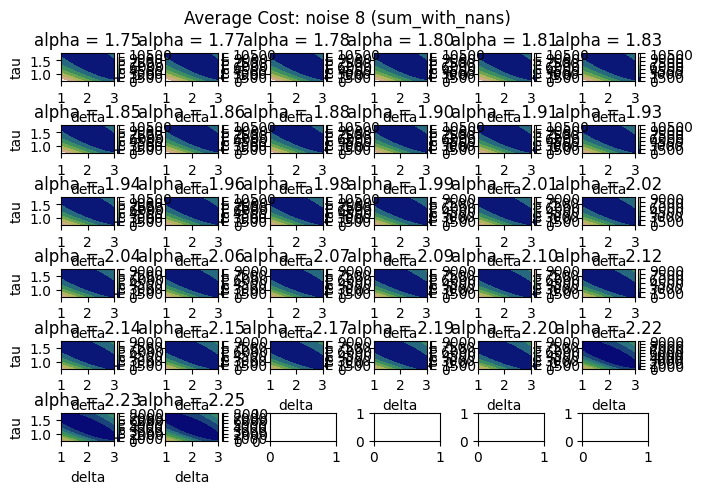

Minimal Cost for Average Cost: noise 9 (sum_with_nans) = 80.87626435832283; at
          delta       tau     alpha
79823  2.225806  1.233871  2.056452


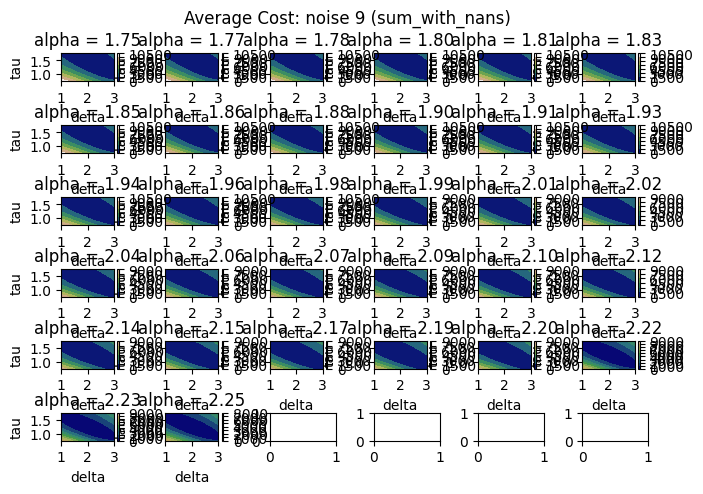

Minimal Cost for Average Cost: noise 10 (sum_with_nans) = 99.58635733580728; at
          delta       tau     alpha
79823  2.225806  1.233871  2.056452


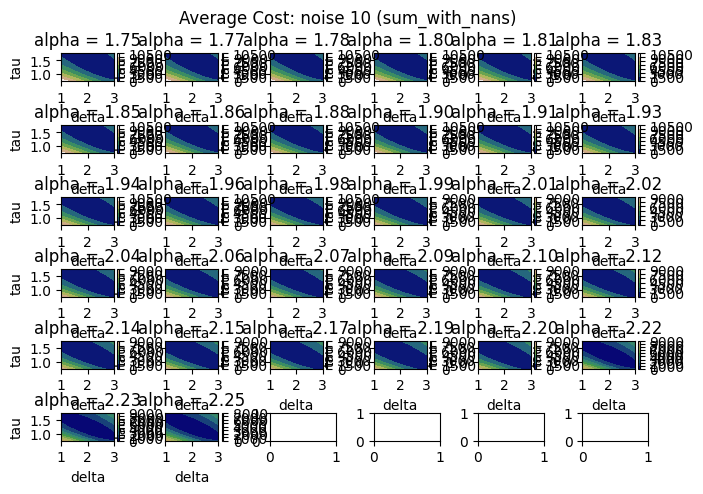

In [18]:
model_name = 'sum_with_nans'
for noise in noise_range:
    df_to_plot = df[df['model_name'] == model_name].drop(columns='model_name')
    columns_to_choose = np.char.startswith(df_to_plot.columns.to_numpy().astype(str), f'{noise}noise')
    columns_for_noise = df_to_plot.columns[columns_to_choose]

    average_df = df_to_plot.loc[:,['delta', 'tau', 'alpha']]
    average_df[f'Average Cost: noise {noise} ({model_name})'] = df_to_plot[columns_for_noise].mean(axis=1)
    plot_all_search_results_2d(average_df, separate_by='alpha')

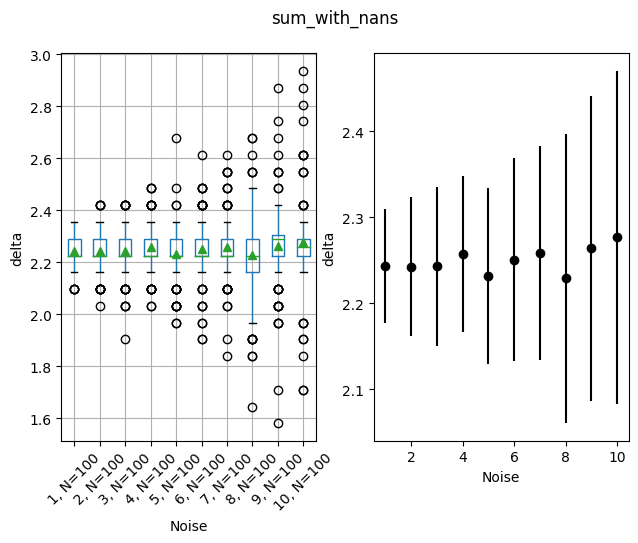

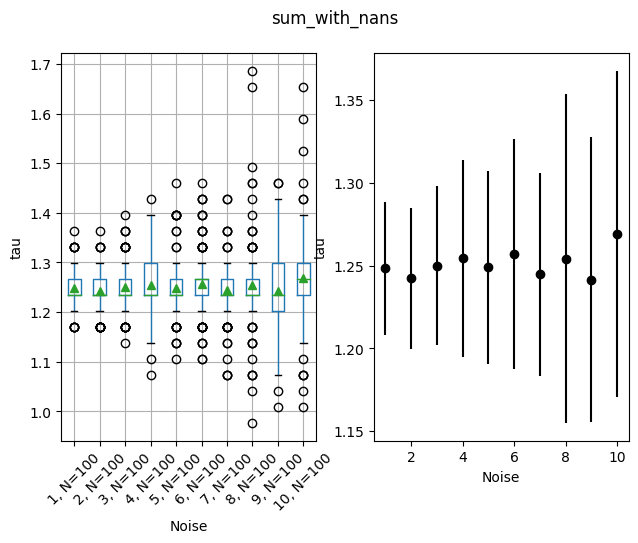

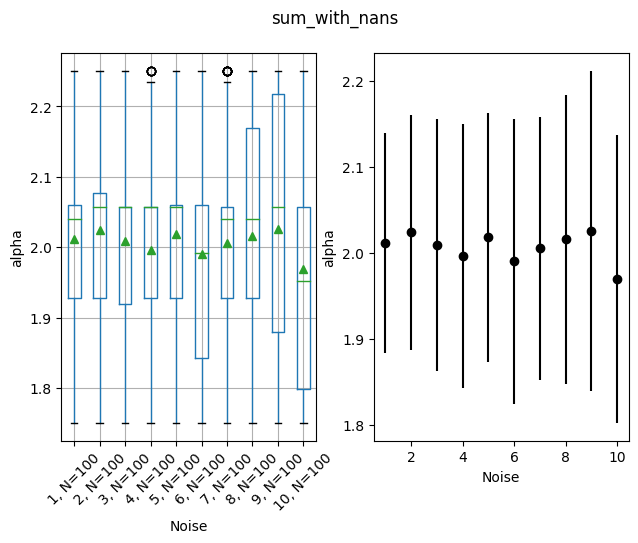

In [19]:
data = []
df_to_plot = df[df['model_name'] == model_name].drop(columns='model_name')
for noise in noise_range:
    columns_to_choose = np.char.startswith(df_to_plot.columns.to_numpy().astype(str), f'{noise}noise')
    columns_for_noise = df_to_plot.columns[columns_to_choose]
    for point in zip(*np.where(~np.isnan(df[columns_for_noise][df[columns_for_noise] == df[columns_for_noise].min()].to_numpy()))):
        row_of_interest = df.iloc[point[0]]
        data.append([row_of_interest['delta'], row_of_interest['tau'], row_of_interest['alpha'], noise])

chosen_points = pd.DataFrame(data, columns=['delta', 'tau', 'alpha', 'noise']).groupby('noise')

for variable in ['delta', 'tau', 'alpha']:
    fig, axs = plt.subplots(1, 2)
    fig.suptitle(model_name)
    fig.tight_layout()
    axs[0].set_ylabel(variable)
    axs[0].set_xlabel('Noise')
    axs[0] = chosen_points.boxplot(subplots=False, column=variable, rot=45, ax=axs[0], showmeans=True)
    axs[1].set_ylabel(variable)
    axs[1].set_xlabel('Noise')
    axs[1].errorbar(noise_range, chosen_points.mean()[variable], chosen_points.std()[variable], fmt='ok')
    labels = chosen_points.count()
    labels = [f'{noise}, N={n[0].item()}' for noise, n in zip(labels.index, labels.values)]
    plt.setp(axs[0], xticklabels=labels)
    plt.show()

## Local Minima Analysis

### Downsample without missing data

In [20]:
model = df['model_name'].unique()[0]
print(f"For Model '{model}'")
portion_df = df[df['model_name'] == model].drop(columns='model_name')
delta_unique_values = portion_df['delta'].unique()    
tau_unique_values = portion_df['tau'].unique()
alpha_unique_values = portion_df['alpha'].unique()
new_shape = (delta_unique_values.size, tau_unique_values.size, alpha_unique_values.size)
delta_pts = np.reshape(portion_df['delta'].values, new_shape)
tau_pts = np.reshape(portion_df['tau'].values, new_shape)
alpha_pts = np.reshape(portion_df['alpha'].values, new_shape)

For Model 'downsample_without_nans'


In [21]:
# Find local minima
columns = portion_df.columns.drop(['delta', 'tau', 'alpha'])
     
m = np.reshape(
    portion_df[columns].values.astype(float), 
    (delta_unique_values.size, tau_unique_values.size, alpha_unique_values.size, columns.size)
)

f1 = np.ones((3,3,3,1))
f1[1, 1, 1, 0] = 0
is_minima = m < scipy.ndimage.minimum_filter(m, footprint=f1, mode='constant', cval=np.inf)

In [22]:
local_minima_pts = np.array([pt for pt in zip(*np.where(is_minima))])
local_minima = []
for noise in noise_range:
    columns_with_given_noise = np.where(np.char.startswith(np.array(columns).astype(str), f'{noise}noise'))[0]
    local_minima_with_given_noise = local_minima_pts[np.where(np.isin(local_minima_pts[:,3], columns_with_given_noise))[0],:]
    for point in local_minima_with_given_noise:
        point_as_list = tuple(point.tolist())
        local_minima.append({
            'noise': noise,
            'iteration': columns[point[-1]].split('trial')[-1],
            'cost': m[point_as_list],
            'delta': delta_pts[point_as_list[:-1]],
            'tau': tau_pts[point_as_list[:-1]],
            'alpha': alpha_pts[point_as_list[:-1]]
        })

local_minima_by_noise = pd.DataFrame(local_minima)
local_minima_by_noise


,noise,iteration,cost,delta,tau,alpha
0,1,66,1.004941,2.096774,1.169355,2.250000
1,1,21,0.932997,2.096774,1.201613,2.201613
2,1,50,0.923507,2.096774,1.201613,2.201613
3,1,63,0.993999,2.096774,1.201613,2.201613
4,1,66,1.000471,2.096774,1.201613,2.201613
...,...,...,...,...,...,...
8403,10,59,106.326928,2.806452,1.201613,1.750000
8404,10,46,102.935147,2.870968,1.008065,1.862903
8405,10,46,102.919687,2.870968,1.040323,1.798387
8406,10,18,113.449311,2.870968,1.201613,1.798387


In [23]:
num_local_minima = local_minima_by_noise.drop(columns=['delta', 'tau', 'alpha']).groupby(['noise', 'iteration']).count()

num_local_minima.rename(columns={'cost': 'Number of Local Minima'}).groupby('noise').mean()

,Number of Local Minima
noise,
1,9.04
2,9.16
3,9.14
4,9.06
5,8.72
6,8.42
7,8.20
8,7.61
9,7.37


#### Local minima at edges

In [24]:
# Delta Min
delta_min = local_minima_by_noise[local_minima_by_noise['delta'] == delta_unique_values.min()]
delta_min

,noise,iteration,cost,delta,tau,alpha


In [25]:
# Delta Max
delta_max = local_minima_by_noise[local_minima_by_noise['delta'] == delta_unique_values.max()]
delta_max

,noise,iteration,cost,delta,tau,alpha


In [26]:
# Tau Min
tau_min = local_minima_by_noise[local_minima_by_noise['tau'] == tau_unique_values.min()]
tau_min

,noise,iteration,cost,delta,tau,alpha


In [27]:
# Tau Max
tau_max = local_minima_by_noise[local_minima_by_noise['tau'] == tau_unique_values.max()]
tau_max

,noise,iteration,cost,delta,tau,alpha


In [28]:
# Alpha Min
alpha_min = local_minima_by_noise[local_minima_by_noise['alpha'] == alpha_unique_values.min()]
alpha_min

,noise,iteration,cost,delta,tau,alpha
801,1,17,1.024614,2.354839,1.330645,1.75
802,1,21,0.927437,2.354839,1.330645,1.75
803,1,24,0.966737,2.354839,1.330645,1.75
804,1,25,1.008882,2.354839,1.330645,1.75
805,1,26,0.927951,2.354839,1.330645,1.75
...,...,...,...,...,...,...
8398,10,67,100.896338,2.806452,1.169355,1.75
8399,10,92,104.153700,2.806452,1.169355,1.75
8402,10,44,92.815258,2.806452,1.201613,1.75
8403,10,59,106.326928,2.806452,1.201613,1.75


In [30]:
alpha_min.astype(str).groupby(['noise'])[['delta', 'tau']].describe()

delta                                  tau                            \
      count unique                top freq count unique                top   
noise                                                                        
1        24      2  2.354838709677418   16    24      3  1.330645161290322   
10       48     14  2.354838709677418    6    48     17  1.201612903225806   
2        37      4  2.354838709677418   16    37      4  1.330645161290322   
3        43      5  2.354838709677418   20    43      5  1.330645161290322   
4        44      6  2.354838709677418   14    44      6  1.330645161290322   
5        30      6  2.354838709677418   12    30      7  1.330645161290322   
6        41      8  2.419354838709676   10    41     10  1.362903225806451   
7        42      9  2.354838709677418   13    42      9  1.298387096774193   
8        44     14  2.419354838709676    8    44     13  1.330645161290322   
9        43     11   2.29032258064516    9    43     12  1.330645161290322   

            
      freq  
noise       
1       17  
10       7  
2       17  
3       18  
4       13  
5       10  
6       10  
7       11  
8       11  
9       10

In [31]:
# Alpha Max
alpha_max = local_minima_by_noise[local_minima_by_noise['alpha'] == alpha_unique_values.max()]
alpha_max

,noise,iteration,cost,delta,tau,alpha
0,1,66,1.004941,2.096774,1.169355,2.25
43,1,32,1.115024,2.096774,1.201613,2.25
44,1,36,1.049428,2.096774,1.201613,2.25
45,1,57,1.005865,2.096774,1.201613,2.25
46,1,62,0.944408,2.096774,1.201613,2.25
...,...,...,...,...,...,...
8293,10,44,92.848394,2.548387,1.072581,2.25
8294,10,59,106.259389,2.548387,1.072581,2.25
8297,10,24,103.232909,2.548387,1.104839,2.25
8361,10,46,103.036211,2.677419,0.943548,2.25


In [32]:
alpha_max.astype(str).groupby(['noise'])[['delta', 'tau']].describe()

delta                                  tau                            \
      count unique                top freq count unique                top   
noise                                                                        
1        39      2  2.161290322580644   28    39      2  1.169354838709677   
10       53     15  2.032258064516128    7    53     12  1.201612903225806   
2        50      4  2.096774193548386   23    50      4  1.169354838709677   
3        50      6  2.096774193548386   19    50      4  1.169354838709677   
4        49      6  2.096774193548386   18    49      5  1.169354838709677   
5        49      7  2.096774193548386   14    49      6  1.169354838709677   
6        44     10  2.161290322580644   13    44      8  1.201612903225806   
7        47     10  2.096774193548386   11    47     10  1.169354838709677   
8        51     13  2.161290322580644   10    51     13  1.201612903225806   
9        50     14   1.96774193548387    8    50     12  1.169354838709677   

            
      freq  
noise       
1       29  
10       7  
2       29  
3       24  
4       20  
5       17  
6        9  
7       14  
8       11  
9        9

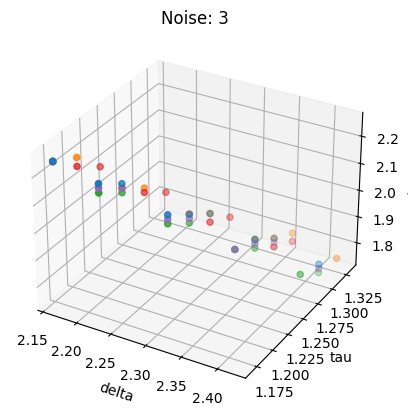

In [33]:
noise = 3
local_minima_at_noise = local_minima_by_noise[local_minima_by_noise['noise'] == noise]
# filter to fewer iterations
subset = local_minima_at_noise[local_minima_at_noise['iteration'].astype(int) < 5]
plt.figure()
ax = plt.axes(projection='3d')
ax.set_title(f'Noise: {noise}')
ax.set_xlabel('delta')
ax.set_ylabel('tau')
ax.set_zlabel('alpha')
for grp_name, grp_idx in subset.groupby('iteration').groups.items():
    ax.scatter(subset.loc[grp_idx, 'delta'].values.astype(float), 
               subset.loc[grp_idx, 'tau'].values.astype(float), 
               subset.loc[grp_idx, 'alpha'].values.astype(float), 
               label=grp_name)
plt.show()

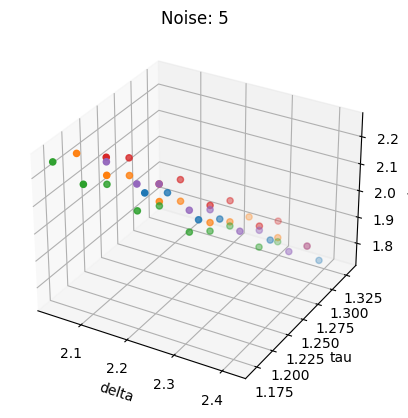

In [34]:
noise = 5
local_minima_at_noise = local_minima_by_noise[local_minima_by_noise['noise'] == noise]
# filter to fewer iterations
subset = local_minima_at_noise[local_minima_at_noise['iteration'].astype(int) < 5]
plt.figure()
ax = plt.axes(projection='3d')
ax.set_title(f'Noise: {noise}')
ax.set_xlabel('delta')
ax.set_ylabel('tau')
ax.set_zlabel('alpha')
for grp_name, grp_idx in subset.groupby('iteration').groups.items():
    ax.scatter(subset.loc[grp_idx, 'delta'].values.astype(float), 
               subset.loc[grp_idx, 'tau'].values.astype(float), 
               subset.loc[grp_idx, 'alpha'].values.astype(float), 
               label=grp_name)
plt.show()

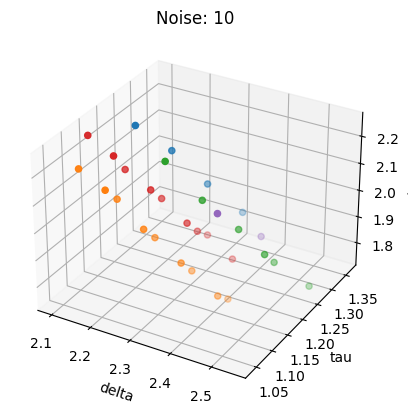

In [35]:
noise = 10
local_minima_at_noise = local_minima_by_noise[local_minima_by_noise['noise'] == noise]
# filter to fewer iterations
subset = local_minima_at_noise[local_minima_at_noise['iteration'].astype(int) < 5]
plt.figure()
ax = plt.axes(projection='3d')
ax.set_title(f'Noise: {noise}')
ax.set_xlabel('delta')
ax.set_ylabel('tau')
ax.set_zlabel('alpha')
for grp_name, grp_idx in subset.groupby('iteration').groups.items():
    ax.scatter(subset.loc[grp_idx, 'delta'].values.astype(float), 
               subset.loc[grp_idx, 'tau'].values.astype(float), 
               subset.loc[grp_idx, 'alpha'].values.astype(float), 
               label=grp_name)
plt.show()

### Downsample with missing data

In [36]:
model = df['model_name'].unique()[1]
print(f"For Model '{model}'")
portion_df = df[df['model_name'] == model].drop(columns='model_name')
delta_unique_values = portion_df['delta'].unique()    
tau_unique_values = portion_df['tau'].unique()
alpha_unique_values = portion_df['alpha'].unique()
new_shape = (delta_unique_values.size, tau_unique_values.size, alpha_unique_values.size)
delta_pts = np.reshape(portion_df['delta'].values, new_shape)
tau_pts = np.reshape(portion_df['tau'].values, new_shape)
alpha_pts = np.reshape(portion_df['alpha'].values, new_shape)

For Model 'downsample_with_nans'


In [37]:
# Find local minima
columns = portion_df.columns.drop(['delta', 'tau', 'alpha'])
     
m = np.reshape(
    portion_df[columns].values.astype(float), 
    (delta_unique_values.size, tau_unique_values.size, alpha_unique_values.size, columns.size)
)

f1 = np.ones((3,3,3,1))
f1[1, 1, 1, 0] = 0
is_minima = m < scipy.ndimage.minimum_filter(m, footprint=f1, mode='constant', cval=np.inf)

In [38]:
local_minima_pts = np.array([pt for pt in zip(*np.where(is_minima))])
local_minima = []
for noise in noise_range:
    columns_with_given_noise = np.where(np.char.startswith(np.array(columns).astype(str), f'{noise}noise'))[0]
    local_minima_with_given_noise = local_minima_pts[np.where(np.isin(local_minima_pts[:,3], columns_with_given_noise))[0],:]
    for point in local_minima_with_given_noise:
        point_as_list = tuple(point.tolist())
        local_minima.append({
            'noise': noise,
            'iteration': columns[point[-1]].split('trial')[-1],
            'cost': m[point_as_list],
            'delta': delta_pts[point_as_list[:-1]],
            'tau': tau_pts[point_as_list[:-1]],
            'alpha': alpha_pts[point_as_list[:-1]]
        })

local_minima_by_noise = pd.DataFrame(local_minima)
local_minima_by_noise


,noise,iteration,cost,delta,tau,alpha
0,1,78,0.931512,2.032258,1.233871,2.233871
1,1,2,0.977722,2.096774,1.169355,2.250000
2,1,51,1.022496,2.096774,1.169355,2.250000
3,1,66,0.979766,2.096774,1.169355,2.250000
4,1,2,0.973080,2.096774,1.201613,2.201613
...,...,...,...,...,...,...
8006,10,90,101.196187,2.870968,1.040323,1.830645
8007,10,67,98.020284,2.870968,1.137097,1.766129
8008,10,18,112.391268,2.870968,1.233871,1.830645
8009,10,18,112.394751,2.870968,1.266129,1.766129


In [39]:
num_local_minima = local_minima_by_noise.drop(columns=['delta', 'tau', 'alpha']).groupby(['noise', 'iteration']).count()

num_local_minima.rename(columns={'cost': 'Number of Local Minima'}).groupby('noise').mean()

,Number of Local Minima
noise,
1,9.13
2,9.14
3,9.06
4,8.89
5,8.36
6,7.75
7,8.04
8,6.83
9,6.43


#### Local minima at edges

In [40]:
# Delta Min
delta_min = local_minima_by_noise[local_minima_by_noise['delta'] == delta_unique_values.min()]
delta_min

,noise,iteration,cost,delta,tau,alpha


In [41]:
# Delta Max
delta_max = local_minima_by_noise[local_minima_by_noise['delta'] == delta_unique_values.max()]
delta_max

,noise,iteration,cost,delta,tau,alpha


In [42]:
# Tau Min
tau_min = local_minima_by_noise[local_minima_by_noise['tau'] == tau_unique_values.min()]
tau_min

,noise,iteration,cost,delta,tau,alpha


In [43]:
# Tau Max
tau_max = local_minima_by_noise[local_minima_by_noise['tau'] == tau_unique_values.max()]
tau_max

,noise,iteration,cost,delta,tau,alpha


In [44]:
# Alpha Min
alpha_min = local_minima_by_noise[local_minima_by_noise['alpha'] == alpha_unique_values.min()]
alpha_min

,noise,iteration,cost,delta,tau,alpha
685,1,50,0.953800,2.290323,1.362903,1.75
805,1,2,0.970971,2.354839,1.330645,1.75
806,1,4,1.021646,2.354839,1.330645,1.75
807,1,5,0.957829,2.354839,1.330645,1.75
808,1,17,0.997263,2.354839,1.330645,1.75
...,...,...,...,...,...,...
7991,10,44,91.437211,2.741935,1.201613,1.75
7992,10,46,106.090048,2.741935,1.201613,1.75
7995,10,97,102.583324,2.741935,1.233871,1.75
8001,10,92,101.412275,2.806452,1.169355,1.75


In [45]:
alpha_min.astype(str).groupby(['noise'])[['delta', 'tau']].describe()

delta                                  tau                            \
      count unique                top freq count unique                top   
noise                                                                        
1        32      3  2.354838709677418   18    32      3  1.330645161290322   
10       54     14  2.354838709677418    8    54     17  1.266129032258064   
2        44      5  2.419354838709676   22    44      4  1.330645161290322   
3        43      6   2.29032258064516   12    43      6  1.330645161290322   
4        42      7  2.354838709677418   12    42      9  1.330645161290322   
5        36      8  2.419354838709676   11    36     10  1.362903225806451   
6        44     10   2.29032258064516    9    44     12  1.362903225806451   
7        43     10  2.483870967741934   11    43     13  1.330645161290322   
8        41     15   2.29032258064516    7    41     16  1.524193548387096   
9        44     13   2.29032258064516    9    44     16  1.266129032258064   

            
      freq  
noise       
1       21  
10       7  
2       21  
3       16  
4       10  
5       12  
6       10  
7        9  
8        4  
9        8

In [46]:
# Alpha Max
alpha_max = local_minima_by_noise[local_minima_by_noise['alpha'] == alpha_unique_values.max()]
alpha_max

,noise,iteration,cost,delta,tau,alpha
1,1,2,0.977722,2.096774,1.169355,2.25
2,1,51,1.022496,2.096774,1.169355,2.25
3,1,66,0.979766,2.096774,1.169355,2.25
37,1,8,1.019377,2.096774,1.201613,2.25
38,1,18,0.931614,2.096774,1.201613,2.25
...,...,...,...,...,...,...
7803,10,59,104.712114,2.419355,1.072581,2.25
7854,10,45,106.974334,2.483871,1.008065,2.25
7864,10,97,102.565584,2.483871,1.104839,2.25
7903,10,60,102.223120,2.548387,1.040323,2.25


In [47]:
alpha_max.astype(str).groupby(['noise'])[['delta', 'tau']].describe()

delta                                  tau                            \
      count unique                top freq count unique                top   
noise                                                                        
1        39      2  2.161290322580644   26    39      2  1.169354838709677   
10       48     14  2.032258064516128    8    48     14  1.169354838709677   
2        46      5  2.161290322580644   21    46      4  1.169354838709677   
3        52      6  2.096774193548386   21    52      6  1.169354838709677   
4        39      7  2.096774193548386   12    39      8  1.137096774193548   
5        55      9  2.161290322580644   12    55      9  1.201612903225806   
6        49     11  2.096774193548386   14    49     10  1.137096774193548   
7        56     12  2.032258064516128   10    56     10  1.201612903225806   
8        51     13  2.225806451612902    8    51     13  1.169354838709677   
9        46     15  2.161290322580644    8    46     13  1.104838709677419   

            
      freq  
noise       
1       29  
10      10  
2       25  
3       25  
4       11  
5       18  
6       10  
7       11  
8       11  
9        9

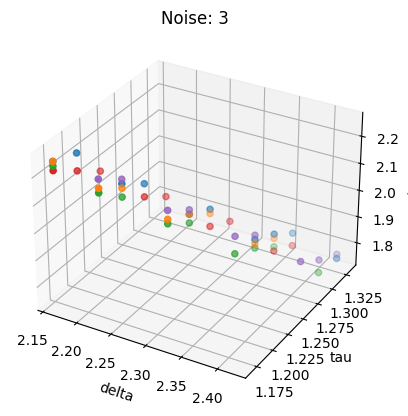

In [48]:
noise = 3
local_minima_at_noise = local_minima_by_noise[local_minima_by_noise['noise'] == noise]
# filter to fewer iterations
subset = local_minima_at_noise[local_minima_at_noise['iteration'].astype(int) < 5]
plt.figure()
ax = plt.axes(projection='3d')
ax.set_title(f'Noise: {noise}')
ax.set_xlabel('delta')
ax.set_ylabel('tau')
ax.set_zlabel('alpha')
for grp_name, grp_idx in subset.groupby('iteration').groups.items():
    ax.scatter(subset.loc[grp_idx, 'delta'].values.astype(float), 
               subset.loc[grp_idx, 'tau'].values.astype(float), 
               subset.loc[grp_idx, 'alpha'].values.astype(float), 
               label=grp_name)
plt.show()

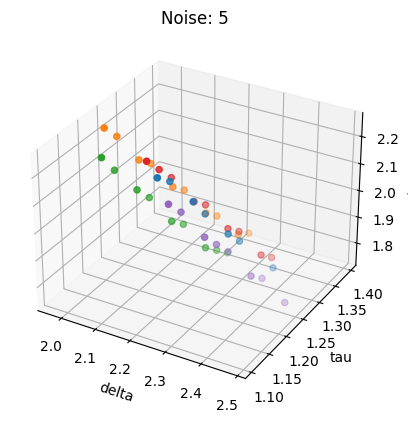

In [49]:
noise = 5
local_minima_at_noise = local_minima_by_noise[local_minima_by_noise['noise'] == noise]
# filter to fewer iterations
subset = local_minima_at_noise[local_minima_at_noise['iteration'].astype(int) < 5]
plt.figure()
ax = plt.axes(projection='3d')
ax.set_title(f'Noise: {noise}')
ax.set_xlabel('delta')
ax.set_ylabel('tau')
ax.set_zlabel('alpha')
for grp_name, grp_idx in subset.groupby('iteration').groups.items():
    ax.scatter(subset.loc[grp_idx, 'delta'].values.astype(float), 
               subset.loc[grp_idx, 'tau'].values.astype(float), 
               subset.loc[grp_idx, 'alpha'].values.astype(float), 
               label=grp_name)
plt.show()

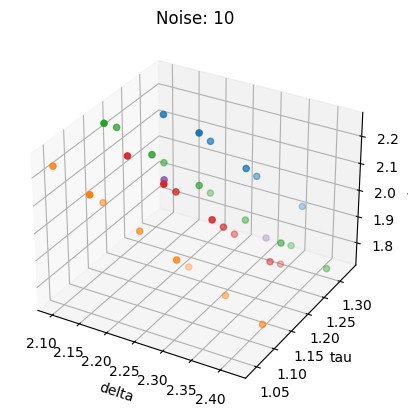

In [50]:
noise = 10
local_minima_at_noise = local_minima_by_noise[local_minima_by_noise['noise'] == noise]
# filter to fewer iterations
subset = local_minima_at_noise[local_minima_at_noise['iteration'].astype(int) < 5]
plt.figure()
ax = plt.axes(projection='3d')
ax.set_title(f'Noise: {noise}')
ax.set_xlabel('delta')
ax.set_ylabel('tau')
ax.set_zlabel('alpha')
for grp_name, grp_idx in subset.groupby('iteration').groups.items():
    ax.scatter(subset.loc[grp_idx, 'delta'].values.astype(float), 
               subset.loc[grp_idx, 'tau'].values.astype(float), 
               subset.loc[grp_idx, 'alpha'].values.astype(float), 
               label=grp_name)
plt.show()

### Sum without missing data

In [51]:
model = df['model_name'].unique()[2]
print(f"For Model '{model}'")
portion_df = df[df['model_name'] == model].drop(columns='model_name')
delta_unique_values = portion_df['delta'].unique()    
tau_unique_values = portion_df['tau'].unique()
alpha_unique_values = portion_df['alpha'].unique()
new_shape = (delta_unique_values.size, tau_unique_values.size, alpha_unique_values.size)
delta_pts = np.reshape(portion_df['delta'].values, new_shape)
tau_pts = np.reshape(portion_df['tau'].values, new_shape)
alpha_pts = np.reshape(portion_df['alpha'].values, new_shape)

For Model 'sum_without_nans'


In [52]:
# Find local minima
columns = portion_df.columns.drop(['delta', 'tau', 'alpha'])
     
m = np.reshape(
    portion_df[columns].values.astype(float), 
    (delta_unique_values.size, tau_unique_values.size, alpha_unique_values.size, columns.size)
)

f1 = np.ones((3,3,3,1))
f1[1, 1, 1, 0] = 0
is_minima = m < scipy.ndimage.minimum_filter(m, footprint=f1, mode='constant', cval=np.inf)

In [53]:
local_minima_pts = np.array([pt for pt in zip(*np.where(is_minima))])
local_minima = []
for noise in noise_range:
    columns_with_given_noise = np.where(np.char.startswith(np.array(columns).astype(str), f'{noise}noise'))[0]
    local_minima_with_given_noise = local_minima_pts[np.where(np.isin(local_minima_pts[:,3], columns_with_given_noise))[0],:]
    for point in local_minima_with_given_noise:
        point_as_list = tuple(point.tolist())
        local_minima.append({
            'noise': noise,
            'iteration': columns[point[-1]].split('trial')[-1],
            'cost': m[point_as_list],
            'delta': delta_pts[point_as_list[:-1]],
            'tau': tau_pts[point_as_list[:-1]],
            'alpha': alpha_pts[point_as_list[:-1]]
        })

local_minima_by_noise = pd.DataFrame(local_minima)
local_minima_by_noise


,noise,iteration,cost,delta,tau,alpha
0,1,0,2.648432,2.096774,1.201613,2.233871
1,1,3,2.735599,2.096774,1.201613,2.233871
2,1,4,2.422425,2.096774,1.201613,2.233871
3,1,5,2.564518,2.096774,1.201613,2.233871
4,1,6,2.516056,2.096774,1.201613,2.233871
...,...,...,...,...,...,...
8997,10,33,101.297513,2.419355,1.298387,1.766129
8998,10,50,92.188762,2.419355,1.298387,1.766129
8999,10,88,105.098108,2.419355,1.298387,1.766129
9000,10,31,105.665616,2.419355,1.330645,1.750000


In [54]:
num_local_minima = local_minima_by_noise.drop(columns=['delta', 'tau', 'alpha']).groupby(['noise', 'iteration']).count()

num_local_minima.rename(columns={'cost': 'Number of Local Minima'}).groupby('noise').mean()

,Number of Local Minima
noise,
1,9.00
2,9.00
3,9.00
4,9.00
5,9.00
6,9.00
7,9.00
8,9.00
9,9.00


#### Local minima at edges

In [55]:
# Delta Min
delta_min = local_minima_by_noise[local_minima_by_noise['delta'] == delta_unique_values.min()]
delta_min

,noise,iteration,cost,delta,tau,alpha


In [56]:
# Delta Max
delta_max = local_minima_by_noise[local_minima_by_noise['delta'] == delta_unique_values.max()]
delta_max

,noise,iteration,cost,delta,tau,alpha


In [57]:
# Tau Min
tau_min = local_minima_by_noise[local_minima_by_noise['tau'] == tau_unique_values.min()]
tau_min

,noise,iteration,cost,delta,tau,alpha


In [58]:
# Tau Max
tau_max = local_minima_by_noise[local_minima_by_noise['tau'] == tau_unique_values.max()]
tau_max

,noise,iteration,cost,delta,tau,alpha


In [59]:
# Alpha Min
alpha_min = local_minima_by_noise[local_minima_by_noise['alpha'] == alpha_unique_values.min()]
alpha_min

,noise,iteration,cost,delta,tau,alpha
5300,6,94,34.142657,2.354839,1.330645,1.75
7100,8,41,66.597670,2.354839,1.330645,1.75
8000,9,66,84.053114,2.354839,1.330645,1.75
8900,10,42,94.344966,2.354839,1.330645,1.75
8901,10,43,94.421623,2.354839,1.330645,1.75
8902,10,55,99.206196,2.354839,1.330645,1.75
8994,10,90,100.850795,2.419355,1.298387,1.75
9000,10,31,105.665616,2.419355,1.330645,1.75
9001,10,56,97.562255,2.419355,1.330645,1.75


In [60]:
alpha_min.astype(str).groupby(['noise'])[['delta', 'tau']].describe()

delta                                  tau                            \
      count unique                top freq count unique                top   
noise                                                                        
10        6      2  2.354838709677418    3     6      2  1.330645161290322   
6         1      1  2.354838709677418    1     1      1  1.330645161290322   
8         1      1  2.354838709677418    1     1      1  1.330645161290322   
9         1      1  2.354838709677418    1     1      1  1.330645161290322   

            
      freq  
noise       
10       5  
6        1  
8        1  
9        1

In [61]:
# Alpha Max
alpha_max = local_minima_by_noise[local_minima_by_noise['alpha'] == alpha_unique_values.max()]
alpha_max

,noise,iteration,cost,delta,tau,alpha
80,1,1,2.731039,2.16129,1.169355,2.25
81,1,2,2.744482,2.16129,1.169355,2.25
82,1,11,2.715673,2.16129,1.169355,2.25
83,1,21,2.648022,2.16129,1.169355,2.25
84,1,23,2.856869,2.16129,1.169355,2.25
...,...,...,...,...,...,...
8195,10,85,98.599378,2.16129,1.169355,2.25
8196,10,86,104.343131,2.16129,1.169355,2.25
8197,10,87,94.856606,2.16129,1.169355,2.25
8198,10,94,94.739121,2.16129,1.169355,2.25


In [62]:
alpha_max.astype(str).groupby(['noise'])[['delta', 'tau']].describe()

delta                                  tau                            \
      count unique                top freq count unique                top   
noise                                                                        
1        20      1  2.161290322580644   20    20      1  1.169354838709677   
10       45      2  2.161290322580644   33    45      2  1.169354838709677   
2        39      1  2.161290322580644   39    39      1  1.169354838709677   
3        40      1  2.161290322580644   40    40      1  1.169354838709677   
4        47      1  2.161290322580644   47    47      1  1.169354838709677   
5        50      2  2.161290322580644   49    50      2  1.169354838709677   
6        45      2  2.161290322580644   44    45      2  1.169354838709677   
7        37      2  2.161290322580644   33    37      2  1.169354838709677   
8        43      2  2.161290322580644   32    43      2  1.169354838709677   
9        46      2  2.161290322580644   40    46      2  1.169354838709677   

            
      freq  
noise       
1       20  
10      33  
2       39  
3       40  
4       47  
5       49  
6       44  
7       33  
8       32  
9       40

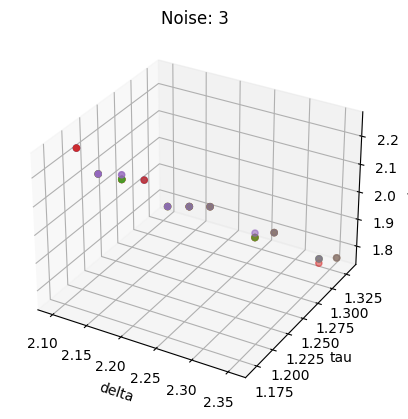

In [63]:
noise = 3
local_minima_at_noise = local_minima_by_noise[local_minima_by_noise['noise'] == noise]
# filter to fewer iterations
subset = local_minima_at_noise[local_minima_at_noise['iteration'].astype(int) < 5]
plt.figure()
ax = plt.axes(projection='3d')
ax.set_title(f'Noise: {noise}')
ax.set_xlabel('delta')
ax.set_ylabel('tau')
ax.set_zlabel('alpha')
for grp_name, grp_idx in subset.groupby('iteration').groups.items():
    ax.scatter(subset.loc[grp_idx, 'delta'].values.astype(float), 
               subset.loc[grp_idx, 'tau'].values.astype(float), 
               subset.loc[grp_idx, 'alpha'].values.astype(float), 
               label=grp_name)
plt.show()

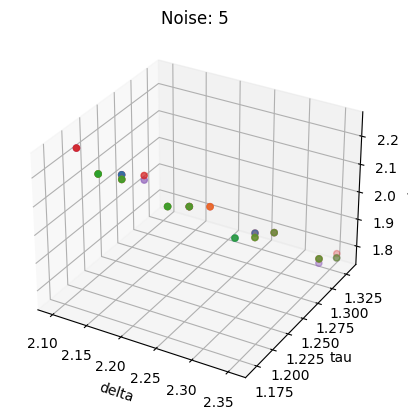

In [64]:
noise = 5
local_minima_at_noise = local_minima_by_noise[local_minima_by_noise['noise'] == noise]
# filter to fewer iterations
subset = local_minima_at_noise[local_minima_at_noise['iteration'].astype(int) < 5]
plt.figure()
ax = plt.axes(projection='3d')
ax.set_title(f'Noise: {noise}')
ax.set_xlabel('delta')
ax.set_ylabel('tau')
ax.set_zlabel('alpha')
for grp_name, grp_idx in subset.groupby('iteration').groups.items():
    ax.scatter(subset.loc[grp_idx, 'delta'].values.astype(float), 
               subset.loc[grp_idx, 'tau'].values.astype(float), 
               subset.loc[grp_idx, 'alpha'].values.astype(float), 
               label=grp_name)
plt.show()

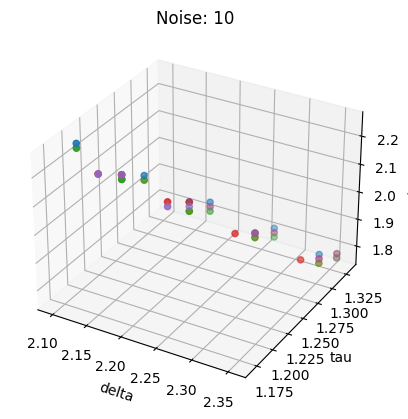

In [65]:
noise = 10
local_minima_at_noise = local_minima_by_noise[local_minima_by_noise['noise'] == noise]
# filter to fewer iterations
subset = local_minima_at_noise[local_minima_at_noise['iteration'].astype(int) < 5]
plt.figure()
ax = plt.axes(projection='3d')
ax.set_title(f'Noise: {noise}')
ax.set_xlabel('delta')
ax.set_ylabel('tau')
ax.set_zlabel('alpha')
for grp_name, grp_idx in subset.groupby('iteration').groups.items():
    ax.scatter(subset.loc[grp_idx, 'delta'].values.astype(float), 
               subset.loc[grp_idx, 'tau'].values.astype(float), 
               subset.loc[grp_idx, 'alpha'].values.astype(float), 
               label=grp_name)
plt.show()

### Sum with missing Data

In [66]:
model = df['model_name'].unique()[3]
print(f"For Model '{model}'")
portion_df = df[df['model_name'] == model].drop(columns='model_name')
delta_unique_values = portion_df['delta'].unique()    
tau_unique_values = portion_df['tau'].unique()
alpha_unique_values = portion_df['alpha'].unique()
new_shape = (delta_unique_values.size, tau_unique_values.size, alpha_unique_values.size)
delta_pts = np.reshape(portion_df['delta'].values, new_shape)
tau_pts = np.reshape(portion_df['tau'].values, new_shape)
alpha_pts = np.reshape(portion_df['alpha'].values, new_shape)

For Model 'sum_with_nans'


In [67]:
# Find local minima
columns = portion_df.columns.drop(['delta', 'tau', 'alpha'])
     
m = np.reshape(
    portion_df[columns].values.astype(float), 
    (delta_unique_values.size, tau_unique_values.size, alpha_unique_values.size, columns.size)
)

f1 = np.ones((3,3,3,1))
f1[1, 1, 1, 0] = 0
is_minima = m < scipy.ndimage.minimum_filter(m, footprint=f1, mode='constant', cval=np.inf)

In [68]:
local_minima_pts = np.array([pt for pt in zip(*np.where(is_minima))])
local_minima = []
for noise in noise_range:
    columns_with_given_noise = np.where(np.char.startswith(np.array(columns).astype(str), f'{noise}noise'))[0]
    local_minima_with_given_noise = local_minima_pts[np.where(np.isin(local_minima_pts[:,3], columns_with_given_noise))[0],:]
    for point in local_minima_with_given_noise:
        point_as_list = tuple(point.tolist())
        local_minima.append({
            'noise': noise,
            'iteration': columns[point[-1]].split('trial')[-1],
            'cost': m[point_as_list],
            'delta': delta_pts[point_as_list[:-1]],
            'tau': tau_pts[point_as_list[:-1]],
            'alpha': alpha_pts[point_as_list[:-1]]
        })

local_minima_by_noise = pd.DataFrame(local_minima)
local_minima_by_noise


,noise,iteration,cost,delta,tau,alpha
0,1,3,2.860902,2.096774,1.201613,2.233871
1,1,4,2.662379,2.096774,1.201613,2.233871
2,1,5,2.590892,2.096774,1.201613,2.233871
3,1,6,2.560226,2.096774,1.201613,2.233871
4,1,8,2.743960,2.096774,1.201613,2.233871
...,...,...,...,...,...,...
9003,10,21,101.612950,2.419355,1.298387,1.782258
9004,10,56,96.144041,2.419355,1.298387,1.782258
9005,10,31,100.486040,2.419355,1.330645,1.750000
9006,10,56,96.066513,2.419355,1.330645,1.750000


In [69]:
num_local_minima = local_minima_by_noise.drop(columns=['delta', 'tau', 'alpha']).groupby(['noise', 'iteration']).count()

num_local_minima.rename(columns={'cost': 'Number of Local Minima'}).groupby('noise').mean()

,Number of Local Minima
noise,
1,9.00
2,9.00
3,9.00
4,9.00
5,9.00
6,9.00
7,9.00
8,9.02
9,9.03


#### Local minima at edges

In [70]:
# Delta Min
delta_min = local_minima_by_noise[local_minima_by_noise['delta'] == delta_unique_values.min()]
delta_min

,noise,iteration,cost,delta,tau,alpha


In [71]:
# Delta Max
delta_max = local_minima_by_noise[local_minima_by_noise['delta'] == delta_unique_values.max()]
delta_max

,noise,iteration,cost,delta,tau,alpha


In [72]:
# Tau Min
tau_min = local_minima_by_noise[local_minima_by_noise['tau'] == tau_unique_values.min()]
tau_min

,noise,iteration,cost,delta,tau,alpha


In [73]:
# Tau Max
tau_max = local_minima_by_noise[local_minima_by_noise['tau'] == tau_unique_values.max()]
tau_max

,noise,iteration,cost,delta,tau,alpha


In [74]:
# Alpha Min
alpha_min = local_minima_by_noise[local_minima_by_noise['alpha'] == alpha_unique_values.min()]
alpha_min

,noise,iteration,cost,delta,tau,alpha
6200,7,14,45.126400,2.354839,1.330645,1.75
6201,7,26,53.184360,2.354839,1.330645,1.75
7100,8,6,63.811399,2.354839,1.330645,1.75
7101,8,59,60.674344,2.354839,1.330645,1.75
7200,8,13,63.097252,2.419355,1.330645,1.75
7201,8,37,64.850545,2.419355,1.330645,1.75
8002,9,14,79.814542,2.354839,1.330645,1.75
8003,9,74,79.953820,2.354839,1.330645,1.75
8004,9,92,87.260306,2.354839,1.330645,1.75
8102,9,22,84.460145,2.419355,1.330645,1.75


In [75]:
alpha_min.astype(str).groupby(['noise'])[['delta', 'tau']].describe()

delta                                  tau                            \
      count unique                top freq count unique                top   
noise                                                                        
10        7      2  2.419354838709676    4     7      2  1.330645161290322   
7         2      1  2.354838709677418    2     2      1  1.330645161290322   
8         4      2  2.354838709677418    2     4      1  1.330645161290322   
9         6      2  2.354838709677418    3     6      1  1.330645161290322   

            
      freq  
noise       
10       6  
7        2  
8        4  
9        6

In [76]:
# Alpha Max
alpha_max = local_minima_by_noise[local_minima_by_noise['alpha'] == alpha_unique_values.max()]
alpha_max

,noise,iteration,cost,delta,tau,alpha
34,1,0,2.713563,2.16129,1.169355,2.25
35,1,1,2.783412,2.16129,1.169355,2.25
36,1,2,2.772452,2.16129,1.169355,2.25
37,1,7,2.680108,2.16129,1.169355,2.25
38,1,9,2.766979,2.16129,1.169355,2.25
...,...,...,...,...,...,...
8200,10,79,107.502283,2.16129,1.169355,2.25
8201,10,80,98.350199,2.16129,1.169355,2.25
8202,10,82,92.654445,2.16129,1.169355,2.25
8203,10,91,110.113855,2.16129,1.169355,2.25


In [77]:
alpha_max.astype(str).groupby(['noise'])[['delta', 'tau']].describe()

delta                                  tau                            \
      count unique                top freq count unique                top   
noise                                                                        
1        66      1  2.161290322580644   66    66      1  1.169354838709677   
10       41      2  2.161290322580644   28    41      2  1.169354838709677   
2        51      1  2.161290322580644   51    51      1  1.169354838709677   
3        52      2  2.161290322580644   51    52      2  1.169354838709677   
4        47      2  2.161290322580644   46    47      2  1.169354838709677   
5        43      1  2.161290322580644   43    43      1  1.169354838709677   
6        49      2  2.161290322580644   47    49      2  1.169354838709677   
7        32      2  2.161290322580644   27    32      2  1.169354838709677   
8        53      2  2.161290322580644   39    53      2  1.169354838709677   
9        40      2  2.161290322580644   38    40      2  1.169354838709677   

            
      freq  
noise       
1       66  
10      28  
2       51  
3       51  
4       46  
5       43  
6       47  
7       27  
8       39  
9       38

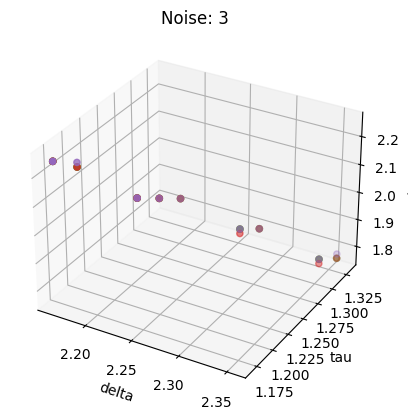

In [78]:
noise = 3
local_minima_at_noise = local_minima_by_noise[local_minima_by_noise['noise'] == noise]
# filter to fewer iterations
subset = local_minima_at_noise[local_minima_at_noise['iteration'].astype(int) < 5]
plt.figure()
ax = plt.axes(projection='3d')
ax.set_title(f'Noise: {noise}')
ax.set_xlabel('delta')
ax.set_ylabel('tau')
ax.set_zlabel('alpha')
for grp_name, grp_idx in subset.groupby('iteration').groups.items():
    ax.scatter(subset.loc[grp_idx, 'delta'].values.astype(float), 
               subset.loc[grp_idx, 'tau'].values.astype(float), 
               subset.loc[grp_idx, 'alpha'].values.astype(float), 
               label=grp_name)
plt.show()

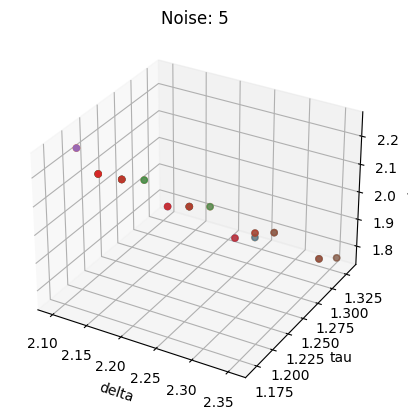

In [79]:
noise = 5
local_minima_at_noise = local_minima_by_noise[local_minima_by_noise['noise'] == noise]
# filter to fewer iterations
subset = local_minima_at_noise[local_minima_at_noise['iteration'].astype(int) < 5]
plt.figure()
ax = plt.axes(projection='3d')
ax.set_title(f'Noise: {noise}')
ax.set_xlabel('delta')
ax.set_ylabel('tau')
ax.set_zlabel('alpha')
for grp_name, grp_idx in subset.groupby('iteration').groups.items():
    ax.scatter(subset.loc[grp_idx, 'delta'].values.astype(float), 
               subset.loc[grp_idx, 'tau'].values.astype(float), 
               subset.loc[grp_idx, 'alpha'].values.astype(float), 
               label=grp_name)
plt.show()

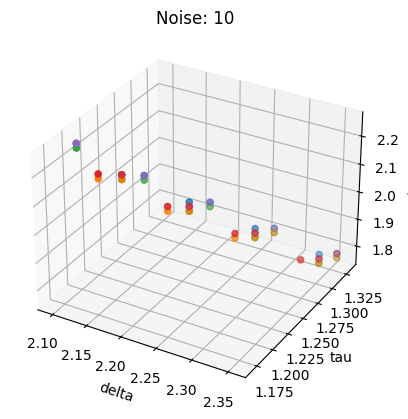

In [80]:
noise = 10
local_minima_at_noise = local_minima_by_noise[local_minima_by_noise['noise'] == noise]
# filter to fewer iterations
subset = local_minima_at_noise[local_minima_at_noise['iteration'].astype(int) < 5]
plt.figure()
ax = plt.axes(projection='3d')
ax.set_title(f'Noise: {noise}')
ax.set_xlabel('delta')
ax.set_ylabel('tau')
ax.set_zlabel('alpha')
for grp_name, grp_idx in subset.groupby('iteration').groups.items():
    ax.scatter(subset.loc[grp_idx, 'delta'].values.astype(float), 
               subset.loc[grp_idx, 'tau'].values.astype(float), 
               subset.loc[grp_idx, 'alpha'].values.astype(float), 
               label=grp_name)
plt.show()